## **Install and Importing Necessary Libraries**

In [1]:
!pip install shap
!pip install keras-tuner
!pip install visualkeras
!pip install lime
!pip install --upgrade shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=276a1f10500f48f14d6609631aa113ca0242416199bcd94236bb9253024bbd90
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
import pandas as pd
import numpy as np
import os
import joblib
import shap
from scipy import stats
from datetime import datetime
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Bidirectional, Dropout, Dense, Attention, Concatenate, Flatten
from tensorflow.keras.callbacks import Callback
import keras_tuner as kt
from tensorflow.keras.models import load_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model
import visualkeras
from tensorflow.keras.models import load_model
from PIL import ImageFont
from lime.lime_tabular import LimeTabularExplainer
import random

## **Loading and Preprocessing the data**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
## Loading the data
path ='/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Data/Rangpur_3_Hourly_Dew_Point_Temperature.csv'
df = pd.read_csv(path)
df

,Index,Year,Month,Time,1,2,3,4,5,6,...,22,23,24,25,26,27,28,29,30,31
0,10208,1980,1,0,8,13,11,10,10,9,...,11,11,8,12,11,10,9,13,6,7
1,10208,1980,1,3,14,15,13,13,11,11,...,12,14,7,13,12,12,14,11,6,10
2,10208,1980,1,6,13,15,15,14,9,9,...,11,12,8,14,12,13,11,7,3,10
3,10208,1980,1,9,12,16,16,11,8,8,...,10,11,7,7,9,9,11,*****,11,8
4,10208,1980,1,12,14,*****,14,14,12,12,...,14,12,10,14,11,10,10,3,4,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4219,10208,2023,12,9,17,14,19,16,17,18,...,13,14,17,15,13,16,15,14,14,16
4220,10208,2023,12,12,18,20,19,20,20,22,...,17,16,19,18,19,19,19,18,18,17
4221,10208,2023,12,15,19,19,20,19,19,21,...,16,16,18,18,17,18,19,17,17,16
4222,10208,2023,12,18,18,18,19,19,19,19,...,15,16,17,17,16,18,17,17,16,15


In [5]:
# Melt the DataFrame into a long format
df_dew = pd.melt(df, id_vars=['Index', 'Year', 'Month', 'Time'], var_name='Day', value_name='DewPointTemperature')
df_dew

,Index,Year,Month,Time,Day,DewPointTemperature
0,10208,1980,1,0,1,8
1,10208,1980,1,3,1,14
2,10208,1980,1,6,1,13
3,10208,1980,1,9,1,12
4,10208,1980,1,12,1,14
...,...,...,...,...,...,...
130939,10208,2023,12,9,31,16
130940,10208,2023,12,12,31,17
130941,10208,2023,12,15,31,16
130942,10208,2023,12,18,31,15


In [6]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,object
DewPointTemperature,object


In [7]:
# Find unique values in 'Year column
df_dew['Year'].unique()

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023])

In [8]:
# Find unique values in 'Month column
df_dew['Month'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [9]:
# Find unique values in 'Time' column
df_dew['Time'].unique()

array([ 0,  3,  6,  9, 12, 15, 18, 21])

In [10]:
# Find unique values in 'Day' column
df_dew['Day'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31'], dtype=object)

In [11]:
# Convert the Day column to numeric
df_dew['Day'] = pd.to_numeric(df_dew['Day'])
df_dew

,Index,Year,Month,Time,Day,DewPointTemperature
0,10208,1980,1,0,1,8
1,10208,1980,1,3,1,14
2,10208,1980,1,6,1,13
3,10208,1980,1,9,1,12
4,10208,1980,1,12,1,14
...,...,...,...,...,...,...
130939,10208,2023,12,9,31,16
130940,10208,2023,12,12,31,17
130941,10208,2023,12,15,31,16
130942,10208,2023,12,18,31,15


In [12]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,int64
DewPointTemperature,object


In [13]:
# Find unique values in 'DewPointTemperature' column
df_dew['DewPointTemperature'].unique()

array(['8', '14', '13', '12', '7', '11', '9', '18', '17', '19', '16',
       '15', '20', '21', '22', '23', '24', '25', '27', '26', '25.5', '28',
       '10', '6', '29', '30', '*****', '3', '5', '2', '28.8', '14.6',
       '9.8', '11.5', '10.5', '26.7', '12.5', '12.7', '11.6', '16.8',
       '23.5', '16.6', '21.8', '19.6', '20.7', '12.6', '24.9', '23.9',
       '25.7', '26.5', '22.6', '14.8', '15.8', '17.6', '10.8', '13.6',
       '26.6', '25.6', '26.8', '18.6', '8.5', '10.7', '9.5', '24.8',
       '13.8', '15.6', '24.6', '15.5', '21.6', '1', '24.7', '11.8',
       '18.8', '12.8', '25.9', '25.8', '14.7', '11.9', '17.7', '17.8',
       '20.8', '10.6', '13.5', '4', '9.7', '12.4', '25.3', '9.3', '11.7',
       '20.6', '8.8', '15.7', '13.4', '24.5', '14.9', '18.7', '9.6',
       '21.5', '20.5', '9.9', '10.9', '27.6', '22.8', '17.5', '23.6',
       '18.5', '16.5', '22.5', '23.2', '23.3', '11.4', '18.4', '15.4',
       '23.8', '17.4', '12.9', '24.1', '23.7', '27.5', '14.5', '13.9',
       '7.

In [14]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*****'].count()

1009

In [15]:
# To find the null values
df_dew.isnull().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,2376


In [16]:
# To find the NaN values
df_dew.isna().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,2376


In [17]:
# Replace '****' with NaN in the original DataFrame
df_dew.loc[df_dew['DewPointTemperature'] == '*****', 'DewPointTemperature'] = np.nan

# Drop the rows with NaN in the 'Value' column
df_dew = df_dew.dropna(subset=['DewPointTemperature'])

In [18]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*****'].count()

0

In [19]:
# To find the null values
df_dew.isnull().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,0


In [20]:
# To find the null values
df_dew.isna().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,0


In [21]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*'].count()

0

In [22]:
# Convert 'DewPointTemperature' column to numeric in the original DataFrame
df_dew['DewPointTemperature'] = pd.to_numeric(df_dew['DewPointTemperature'], errors='coerce')

<ipython-input-22-ba111a5de3e6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dew['DewPointTemperature'] = pd.to_numeric(df_dew['DewPointTemperature'], errors='coerce')


In [23]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,int64
DewPointTemperature,float64


In [24]:
df_dew = df_dew.drop(columns=['Index'])

In [25]:
df_dew = df_dew[['Year', 'Month', 'Day', 'Time', 'DewPointTemperature']]

In [26]:
df_dew

,Year,Month,Day,Time,DewPointTemperature
0,1980,1,1,0,8.0
1,1980,1,1,3,14.0
2,1980,1,1,6,13.0
3,1980,1,1,9,12.0
4,1980,1,1,12,14.0
...,...,...,...,...,...
130939,2023,12,31,9,16.0
130940,2023,12,31,12,17.0
130941,2023,12,31,15,16.0
130942,2023,12,31,18,15.0


In [27]:
# describe() function to get the descriptive statistics of the dataset. This can help identify values that are out of range.
df_dew.describe()

,Year,Month,Day,Time,DewPointTemperature
count,127559.000000,127559.000000,127559.000000,127559.000000,127559.000000
mean,2001.644917,6.518176,15.721909,10.498483,20.479796
std,12.635367,3.458067,8.798470,6.874717,5.464719
min,1980.000000,1.000000,1.000000,0.000000,1.000000
25%,1991.000000,4.000000,8.000000,3.000000,16.000000
50%,2002.000000,7.000000,16.000000,12.000000,22.000000
75%,2013.000000,10.000000,23.000000,15.000000,25.000000
max,2023.000000,12.000000,31.000000,21.000000,31.900000


In [28]:
df_dew.corr()

,Year,Month,Day,Time,DewPointTemperature
Year,1.000000,0.002920,0.000521,0.000288,0.081328
Month,0.002920,1.000000,0.010767,-0.000152,0.304341
Day,0.000521,0.010767,1.000000,-0.000251,0.003096
Time,0.000288,-0.000152,-0.000251,1.000000,0.043475
DewPointTemperature,0.081328,0.304341,0.003096,0.043475,1.000000



## **Feature Engineering**

In [29]:
df_dew['Year'] = df_dew['Year'].astype(int)
df_dew['Month'] = df_dew['Month'].astype(int)
df_dew['Day'] = df_dew['Day'].astype(int)


In [30]:
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.fftpack import fft

# Define function to determine the season based on month and day
def get_season(month, day):
    if (month == 11) or (month == 12) or (month == 1) or (month == 2):
        return 'Winter'
    elif (month >= 3 and month <= 6):
        return 'Summer'
    elif (month >= 7 and month <= 10):
        return 'Rainy'
    return 'Unknown'

# Create Date and other features
def create_date(row):
    try:
        return datetime(year=int(row['Year']), month=int(row['Month']), day=int(row['Day']))
    except Exception as e:
        print(f"Error creating date for row: {row}, Error: {e}")
        return pd.NaT  # Return Not a Time if there's an error

# Define function to categorize day or night
def day_or_night(hour):
    if 6 <= hour < 18:
        return 'Day'
    else:
        return 'Night'

# Apply functions and check for NaT values
df_dew['Date'] = df_dew.apply(create_date, axis=1)
print(df_dew['Date'].isna().sum())

df_dew['DayOfYear'] = df_dew['Date'].dt.dayofyear
df_dew['Year'] = df_dew['Year'] - df_dew['Year'].min()  # Normalize the year

# Add season
df_dew['Season'] = df_dew.apply(lambda row: get_season(row['Month'], row['Day']), axis=1)

# One-Hot Encoding for Season
df_dew = pd.get_dummies(df_dew, columns=['Season'], prefix='Season')

# Convert boolean to numeric for season columns
season_columns = [col for col in df_dew.columns if col.startswith('Season_')]
df_dew[season_columns] = df_dew[season_columns].astype(int)

# Cyclical Encoding for Month
df_dew['Month_sin'] = np.sin(2 * np.pi * df_dew['Month'] / 12)
df_dew['Month_cos'] = np.cos(2 * np.pi * df_dew['Month'] / 12)

# Cyclical Encoding for time
df_dew['Time_sin'] = np.sin(2 * np.pi * df_dew['Time'] / 24)
df_dew['Time_cos'] = np.cos(2 * np.pi * df_dew['Time'] / 24)

# Add Day/Night feature
df_dew['DayOrNight'] = df_dew['Time'].apply(day_or_night)

# One-Hot Encoding for Day/Night
df_dew = pd.get_dummies(df_dew, columns=['DayOrNight'], prefix='DayOrNight')

# Convert boolean to numeric for day/night columns
day_night_columns = [col for col in df_dew.columns if col.startswith('DayOrNight_')]
df_dew[day_night_columns] = df_dew[day_night_columns].astype(int)

# Seasonal decomposition
df_dew = df_dew.sort_values(by='Date')
df_dew.set_index('Date', inplace=True)

# Perform seasonal decomposition
decomposition = seasonal_decompose(df_dew['DewPointTemperature'].dropna(), model='additive', period=8)  # period = 8 (since you have 8 observations per day)

# Add decomposition components to the DataFrame
df_dew['Trend'] = decomposition.trend

# Drop NaN values resulting from the decomposition
df_dew.dropna(inplace=True)

# Define features and target
features = df_dew[['Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']]
target = df_dew['DewPointTemperature']



0


In [31]:
features.head()

,Year,Month_sin,Month_cos,DayOfYear,Time_sin,Time_cos,DayOrNight_Day,DayOrNight_Night,Season_Rainy,Season_Summer,Season_Winter,Trend
Date,,,,,,,,,,,,
1980-01-01,0,0.5,0.866025,1,1.224647e-16,-1.000000e+00,1,0,0,0,1,12.5625
1980-01-01,0,0.5,0.866025,1,-7.071068e-01,-7.071068e-01,1,0,0,0,1,13.1250
1980-01-01,0,0.5,0.866025,1,-1.000000e+00,-1.836970e-16,0,1,0,0,1,13.3750
1980-01-01,0,0.5,0.866025,1,-7.071068e-01,7.071068e-01,0,1,0,0,1,13.4375
1980-01-02,0,0.5,0.866025,2,1.000000e+00,6.123234e-17,1,0,0,0,1,13.2500


In [32]:
features.shape

(127551, 12)

In [33]:
df_dew

,Year,Month,Day,Time,DewPointTemperature,DayOfYear,Season_Rainy,Season_Summer,Season_Winter,Month_sin,Month_cos,Time_sin,Time_cos,DayOrNight_Day,DayOrNight_Night,Trend
Date,,,,,,,,,,,,,,,,
1980-01-01,0,1,1,12,14.0,1,0,0,1,5.000000e-01,0.866025,1.224647e-16,-1.000000e+00,1,0,12.5625
1980-01-01,0,1,1,15,12.0,1,0,0,1,5.000000e-01,0.866025,-7.071068e-01,-7.071068e-01,1,0,13.1250
1980-01-01,0,1,1,18,12.0,1,0,0,1,5.000000e-01,0.866025,-1.000000e+00,-1.836970e-16,0,1,13.3750
1980-01-01,0,1,1,21,12.0,1,0,0,1,5.000000e-01,0.866025,-7.071068e-01,7.071068e-01,0,1,13.4375
1980-01-02,0,1,2,6,15.0,2,0,0,1,5.000000e-01,0.866025,1.000000e+00,6.123234e-17,1,0,13.2500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-30,43,12,30,21,15.0,364,0,0,1,-2.449294e-16,1.000000,-7.071068e-01,7.071068e-01,0,1,15.6250
2023-12-31,43,12,31,18,15.0,365,0,0,1,-2.449294e-16,1.000000,-1.000000e+00,-1.836970e-16,0,1,15.6250
2023-12-31,43,12,31,0,15.0,365,0,0,1,-2.449294e-16,1.000000,0.000000e+00,1.000000e+00,0,1,15.6875


In [34]:
# Calculate correlation matrix
correlation_matrix = features.copy()
correlation_matrix['DewPointTemperature'] = target
correlation_matrix = correlation_matrix.corr()

# Print correlation with the target variable
print(correlation_matrix['DewPointTemperature'].sort_values(ascending=False))

DewPointTemperature    1.000000
Trend                  0.964996
Season_Rainy           0.609255
DayOfYear              0.300768
Season_Summer          0.118677
Year                   0.081303
DayOrNight_Day         0.030745
DayOrNight_Night      -0.030745
Time_sin              -0.043497
Time_cos              -0.053385
Month_sin             -0.559979
Month_cos             -0.682598
Season_Winter         -0.729117
Name: DewPointTemperature, dtype: float64


In [35]:
# Define the directory path
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Final_Data/Version_1/'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Save the DataFrame to a CSV file
df_dew.to_csv(os.path.join(directory, 'rangpur_dew_point_data.csv'), index=False)

## **Scaling the dataset**

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler for features
Rangpur_dew_point_feature_scaler = MinMaxScaler()
features_scaled = Rangpur_dew_point_feature_scaler.fit_transform(features)

# Initialize the MinMaxScaler for the target
Rangpur_dew_point_target_scaler = MinMaxScaler()
target_scaled = target.values.reshape(-1, 1)
target_scaled = Rangpur_dew_point_target_scaler.fit_transform(target_scaled)


In [ ]:
features_scaled

array([[0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.33419689],
       [0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.35751295],
       [0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.36787565],
       ...,
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.46373057],
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.45854922],
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.4507772 ]])

In [ ]:
target_scaled

array([[0.42071197],
       [0.35598706],
       [0.35598706],
       ...,
       [0.45307443],
       [0.45307443],
       [0.45307443]])

## Saving the Scaled features and targets

In [ ]:
import os

# Define the directory path
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Save the scaled features
np.save(os.path.join(directory, 'features_scaled.npy'), features_scaled)

# Save the scaled target
np.save(os.path.join(directory, 'target_scaled.npy'), target_scaled)

## Saving the Scaler

In [ ]:
# Define the directory to save the scalers
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/'

# Create the directory if it does not exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the feature scaler
feature_scaler_path = f'{directory}Rangpur_dew_point_feature_scaler.pkl'
joblib.dump(Rangpur_dew_point_feature_scaler, feature_scaler_path)

# Save the target scaler
target_scaler_path = f'{directory}Rangpur_dew_point_target_scaler.pkl'
joblib.dump(Rangpur_dew_point_target_scaler, target_scaler_path)

print(f"Scalers saved to {directory}")


Scalers saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/


In [ ]:
features_scaled.shape

(127551, 12)

## Splitting the data

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    features_scaled, target_scaled, test_size=0.2, random_state=42
)


# For simplicity, we use time_steps = 1 since each row is a separate observation
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [ ]:
X_train.shape

(102040, 1, 12)

In [ ]:
X_test.shape

(25511, 1, 12)

In [ ]:
y_train.shape

(102040, 1)

## Saving the train and test data

In [ ]:
# Define the save directory in Google Drive
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'
os.makedirs(save_dir, exist_ok=True)

# Save the reshaped arrays to Google Drive
np.save(os.path.join(save_dir, 'X_train.npy'), X_train)
np.save(os.path.join(save_dir, 'X_test.npy'), X_test)
np.save(os.path.join(save_dir, 'y_train.npy'), y_train)
np.save(os.path.join(save_dir, 'y_test.npy'), y_test)

print("Data saved to Google Drive.")

Data saved to Google Drive.


## Loading the train and test data

In [ ]:
# Define the directory where the data is saved
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'

# Load the reshaped arrays from Google Drive
X_train = np.load(os.path.join(save_dir, 'X_train.npy'))
X_test = np.load(os.path.join(save_dir, 'X_test.npy'))
y_train = np.load(os.path.join(save_dir, 'y_train.npy'))
y_test = np.load(os.path.join(save_dir, 'y_test.npy'))

print("Data loaded from Google Drive.")

Data loaded from Google Drive.


## **Hyperparameter Training**

In [ ]:
import numpy as np
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dropout, Flatten, Dense, Add, MultiHeadAttention
import keras_tuner as kt
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
import shutil

# # Remove previous tuner directory if it exists
# tuner_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Tuning_Results/Version_1/'
# if os.path.exists(tuner_dir):
#     shutil.rmtree(tuner_dir)

# Define the save directory in Google Drive
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Tuning_Results/Version_1/'
os.makedirs(save_dir, exist_ok=True)

# Custom Metric Functions
def rmse(y_true, y_pred):
    """Calculate Root Mean Squared Error."""
    return np.sqrt(mean_squared_error(y_true, y_pred))

def adjusted_r_squared(y_true, y_pred, n, p):
    """Calculate Adjusted R-Squared."""
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Custom Callback to Track Additional Metrics
class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data
        self.val_rmse = []
        self.val_mape = []
        self.val_r2 = []
        self.val_adjusted_r2 = []

    def on_epoch_end(self, epoch, logs=None):
        X_val, y_val_true = self.validation_data
        y_val_pred = self.model.predict(X_val)

        rmse_value = rmse(y_val_true, y_val_pred)
        mape_value = mean_absolute_percentage_error(y_val_true, y_val_pred)
        r2_value = r2_score(y_val_true, y_val_pred)
        adjusted_r2_value = adjusted_r_squared(y_val_true, y_val_pred, len(y_val_true), X_train.shape[2])

        self.val_rmse.append(rmse_value)
        self.val_mape.append(mape_value)
        self.val_r2.append(r2_value)
        self.val_adjusted_r2.append(adjusted_r2_value)

        print(f"Epoch {epoch+1}: val_rmse: {rmse_value:.4f} - val_mape: {mape_value:.4f} - val_r2: {r2_value:.4f} - val_adjusted_r2: {adjusted_r2_value:.4f}")

# Define a function to build the TCN model with Multi-Head Attention
def build_model(hp):
    inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))  # (time_steps, features)

    # Initial convolution layer
    x = Conv1D(
        filters=hp.Int('filters', min_value=64, max_value=256, step=64),
        kernel_size=hp.Choice('kernel_size', values=[2, 3, 5]),
        padding='causal',
        activation='relu',
        kernel_regularizer=regularizers.l2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='log'))
    )(inputs)

    residual = x  # Store the initial x for the residual connection

    # Add TCN layers with dilation
    for i in range(hp.Int('num_layers', min_value=2, max_value=5)):
        x = Conv1D(
            filters=hp.Int('filters', min_value=64, max_value=256, step=64),
            kernel_size=hp.Choice('kernel_size', values=[2, 3, 5]),
            dilation_rate=2**i,
            padding='causal',
            activation='relu',
            kernel_regularizer=regularizers.l2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='log'))
        )(x)
        x = Dropout(rate=hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1))(x)

        # Adjust residual connection to match the shape
        if residual.shape[1] != x.shape[1]:
            residual = Conv1D(filters=x.shape[2], kernel_size=1, padding='same')(residual)

        x = Add()([x, residual])  # Residual connection
        residual = x  # Update residual for the next layer

    # Apply Multi-Head Attention
    attention_output = MultiHeadAttention(
        num_heads=hp.Int('num_heads', min_value=2, max_value=8, step=2),
        key_dim=hp.Int('key_dim', min_value=16, max_value=64, step=16)
    )(x, x)
    attention_output = Dropout(rate=hp.Float('attention_dropout', min_value=0.2, max_value=0.5, step=0.1))(attention_output)

    # Add residual connection after attention
    x = Add()([x, attention_output])

    # Flatten and Dense layers
    x = Flatten()(x)
    x = Dense(
        units=hp.Int('dense_units', min_value=16, max_value=128, step=16),
        activation='relu'
    )(x)
    x = Dropout(rate=hp.Float('dropout_rate2', min_value=0.2, max_value=0.5, step=0.1))(x)
    outputs = Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
        loss='mean_squared_error',
        metrics=['mean_absolute_error']
    )

    return model

# Reshape data for Conv1D
X_train_tcn = X_train.reshape((X_train.shape[0], X_train.shape[1], X_train.shape[2]))
X_test_tcn = X_test.reshape((X_test.shape[0], X_test.shape[1], X_test.shape[2]))

# Further split the training data into train and validation sets
val_split = 0.2
val_size = int(len(X_train_tcn) * val_split)
X_val = X_train_tcn[-val_size:]
y_val = y_train[-val_size:]
X_train_new = X_train_tcn[:-val_size]
y_train_new = y_train[:-val_size]

# Initialize hyperparameter tuning
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=20,
    executions_per_trial=1,
    directory=save_dir,
    project_name='dew_point_tuning_tcn'
)

# Set up EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    mode='min'
)

# Start the search
tuner.search(
    X_train_new,
    y_train_new,
    epochs=20,
    batch_size=32,
    validation_data=(X_val, y_val),
    verbose=1,
    callbacks=[MetricsCallback(validation_data=(X_val, y_val)), early_stopping]
)

# Extract all trial results after tuning
def extract_all_trial_results(tuner):
    results_list = []
    trials = tuner.oracle.trials
    for trial in trials.values():
        hp = trial.hyperparameters.values
        metrics = {tuner.oracle.objective.name: trial.score}
        result = {**hp, **metrics}
        results_list.append(result)
    return results_list

# Save the results to a CSV file
results_list = extract_all_trial_results(tuner)
if results_list:
    results_df = pd.DataFrame(results_list)
    results_df.to_csv(os.path.join(save_dir, 'hyperparameter_results.csv'), index=False)
    print(f"Hyperparameter results saved to {os.path.join(save_dir, 'hyperparameter_results.csv')}")
else:
    print("No results to save.")


Trial 20 Complete [00h 15m 38s]
val_loss: 0.0026163472793996334

Best val_loss So Far: 0.002167970407754183
Total elapsed time: 23h 46m 18s
Hyperparameter results saved to /content/drive/MyDrive/Dhaka Dew Point Temperature Prediction/Prediction Model/Deep Learning Model/TCN/Tuning_Results/Version_10/hyperparameter_results.csv


## **Loading the Optimal Hyperparameter**

In [ ]:
import pandas as pd

# Define the path to the hyperparameter results CSV file
results_csv_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Tuning_Results/Version_1/hyperparameter_results.csv'

# Load the results from the CSV file
results_df = pd.read_csv(results_csv_path)

# Find the row with the minimum validation loss
best_result = results_df.loc[results_df['val_loss'].idxmin()]

# Print the best result with hyperparameters
print("Best hyperparameters for the optimal validation loss:")
print(best_result)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Tuning_Results/Version_1/hyperparameter_results.csv'

## **Model Trainging With Optimal Hyperparameter**

In [ ]:
import numpy as np
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dropout, Dense, Flatten, Add, MultiHeadAttention
from tensorflow.keras import regularizers as reg
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
import pickle

# Reshape the data for Conv1D
X_train_tcn = X_train.reshape((X_train.shape[0], X_train.shape[1], X_train.shape[2]))
X_test_tcn = X_test.reshape((X_test.shape[0], X_test.shape[1], X_test.shape[2]))

def rmse(y_true, y_pred):
    """Calculate Root Mean Squared Error."""
    return np.sqrt(mean_squared_error(y_true, y_pred))

def adjusted_r_squared(y_true, y_pred, n, p):
    """Calculate Adjusted R-Squared."""
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Define MAPE calculation with safe clipping
def mean_absolute_percentage_error_safe(y_true, y_pred, epsilon=1e-7):
    """Calculate MAPE with clipping to avoid division by zero or near-zero values."""
    y_true = np.clip(y_true, epsilon, None)  # Clip true values to avoid division by zero
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Define the best hyperparameters
best_params = {
    'filters': 192,
    'kernel_size': 2,
    'l2_reg': 0.000290,
    'num_layers': 2,
    'dropout_rate': 0.3,
    'num_heads': 4,
    'key_dim': 48,
    'attention_dropout': 0.2,
    'dense_units': 64,
    'dropout_rate2': 0.4,
    'learning_rate': 0.000197
}

# Define the final model with the same structure as in hyperparameter training
def build_final_tcn_with_attention_model(best_params):
    inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))  # (time_steps, features)

    # Initial convolution layer
    x = Conv1D(
        filters=best_params['filters'],
        kernel_size=best_params['kernel_size'],
        padding='causal',
        activation='relu',
        kernel_regularizer=reg.l2(best_params['l2_reg'])
    )(inputs)

    residual = x  # Store the initial x for the residual connection

    # Add TCN layers with dilation and residual connections
    for i in range(best_params['num_layers']):
        x = Conv1D(
            filters=best_params['filters'],
            kernel_size=best_params['kernel_size'],
            dilation_rate=2**i,
            padding='causal',
            activation='relu',
            kernel_regularizer=reg.l2(best_params['l2_reg'])
        )(x)
        x = Dropout(rate=best_params['dropout_rate'])(x)

        # Adjust residual connection to match the shape
        if residual.shape[1] != x.shape[1]:
            residual = Conv1D(filters=x.shape[2], kernel_size=1, padding='same')(residual)

        x = Add()([x, residual])  # Residual connection
        residual = x  # Update residual for the next layer

    # Apply Multi-Head Attention
    attention_output = MultiHeadAttention(
        num_heads=best_params['num_heads'],
        key_dim=best_params['key_dim']
    )(x, x)
    attention_output = Dropout(rate=best_params['attention_dropout'])(attention_output)

    # Add residual connection after attention
    x = Add()([x, attention_output])

    # Flatten and Dense layers
    x = Flatten()(x)
    x = Dense(
        units=best_params['dense_units'],
        activation='relu'
    )(x)
    x = Dropout(rate=best_params['dropout_rate2'])(x)
    outputs = Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
        loss='mean_squared_error',
        metrics=['mean_absolute_error']  # This will track MAE
    )

    return model

# Build the final model using the best parameters obtained during hyperparameter tuning
final_tcn_attention_model = build_final_tcn_with_attention_model(best_params)

# Split training data into train and validation sets
val_split = 0.2
val_size = int(len(X_train_tcn) * val_split)
X_val = X_train_tcn[-val_size:]
y_val = y_train[-val_size:]
X_train_new = X_train_tcn[:-val_size]
y_train_new = y_train[:-val_size]

# Define the directory and filepath for best model
best_model_directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/'
os.makedirs(best_model_directory, exist_ok=True)
best_model_filepath = os.path.join(best_model_directory, 'Rangpur_dew_point_model_best.keras')

# Create a checkpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath=best_model_filepath,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

# Define the directory and filepath for final model
final_model_directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Final/'
os.makedirs(final_model_directory, exist_ok=True)
final_model_filepath = os.path.join(final_model_directory, 'Rangpur_dew_point_model_final.keras')

# Set up EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    mode='min'
)

# Define the directory for TensorBoard logs
log_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/TensorBoard/Version_1/'
os.makedirs(log_dir, exist_ok=True)

# Create the TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir,
                                   histogram_freq=1,
                                   write_graph=True,
                                   write_images=True)

class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data
        self.val_rmse = []
        self.val_mape = []
        self.val_r2 = []
        self.val_adjusted_r2 = []
        self.val_mae = []  # Add MAE storage

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        val_loss = logs.get('val_loss')

        # Calculate validation metrics
        X_val, y_val = self.validation_data
        y_pred = self.model.predict(X_val)

        rmse_value = rmse(y_val, y_pred)
        mape_value = mean_absolute_percentage_error_safe(y_val, y_pred)
        r2_value = r2_score(y_val, y_pred)
        adjusted_r2_value = adjusted_r_squared(y_val, y_pred, len(y_val), X_val.shape[1])
        mae_value = np.mean(np.abs(y_val - y_pred))  # Calculate MAE

        # Store metrics
        self.val_rmse.append(rmse_value)
        self.val_mape.append(mape_value)
        self.val_r2.append(r2_value)
        self.val_adjusted_r2.append(adjusted_r2_value)
        self.val_mae.append(mae_value)  # Store MAE

        # Print all metrics
        print(f"Epoch {epoch+1}: val_loss: {val_loss:.4f}, val_rmse: {rmse_value:.4f}, val_mape: {mape_value:.4f}, val_r2: {r2_value:.4f}, val_adjusted_r2: {adjusted_r2_value:.4f}, val_mae: {mae_value:.4f}")

metrics_callback = MetricsCallback(validation_data=(X_val, y_val))

# Train the model with callbacks
history = final_tcn_attention_model.fit(
    X_train_new,
    y_train_new,
    epochs=100,
    batch_size=32,
    validation_data=(X_val, y_val),
    verbose=1,
    callbacks=[early_stopping, metrics_callback, checkpoint_callback, tensorboard_callback]
)

# Save the final trained model
final_tcn_attention_model.save(final_model_filepath)
print(f"Final model saved to {final_model_filepath}")

# Save the history object
history_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/History/Version_1/history.pkl'

# Ensure the directory exists
os.makedirs(os.path.dirname(history_filepath), exist_ok=True)

with open(history_filepath, 'wb') as file:
    pickle.dump(history.history, file)

print(f"Training history saved to {history_filepath}")

# Save the MetricsCallback object
metrics_callback_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Metrics_Callback/Version_1/metrics_callback.pkl'

# Ensure the directory exists
os.makedirs(os.path.dirname(metrics_callback_filepath), exist_ok=True)

with open(metrics_callback_filepath, 'wb') as file:
    pickle.dump(metrics_callback, file)

print(f"MetricsCallback object saved to {metrics_callback_filepath}")


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


2550/2551 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0742 - mean_absolute_error: 0.1180

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


638/638 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Epoch 1: val_loss: 0.0113, val_rmse: 0.0436, val_mape: 57071.4425, val_r2: 0.9400, val_adjusted_r2: 0.9400, val_mae: 0.0317

Epoch 1: val_loss improved from inf to 0.01126, saving model to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras
2551/2551 ━━━━━━━━━━━━━━━━━━━━ 51s 19ms/step - loss: 0.0741 - mean_absolute_error: 0.1180 - val_loss: 0.0113 - val_mean_absolute_error: 0.0317
Epoch 2/100
638/638 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Epoch 2: val_loss: 0.0038, val_rmse: 0.0434, val_mape: 52630.1913, val_r2: 0.9406, val_adjusted_r2: 0.9406, val_mae: 0.0312

Epoch 2: val_loss improved from 0.01126 to 0.00384, saving model to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras
2551/2551 ━━━━━━━━━━━━━━━━━━━━ 82s 19ms/step - loss: 0.0136 - mean_absolute_error: 0.0650 - val_loss: 0.0038 - val_mean_absolute_error: 0.0312
Epoch 3/100
638/638 

## **Loading the best model**

In [ ]:
best_model = load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')
best_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 12)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 1, 192)         │          4,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 1, 192)         │         73,920 │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 192)         │              0 │ conv1d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 1, 192)         │              0 │ dropout[0][0],         │
│                           │                        │                │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 1, 192)         │         73,920 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 192)         │              0 │ conv1d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 1, 192)         │              0 │ dropout_1[0][0],       │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 1, 192)         │        148,224 │ add_1[0][0],           │
│ (MultiHeadAttention)      │                        │                │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 192)         │              0 │ multi_head_attention[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 1, 192)         │              0 │ add_1[0][0],           │
│                           │                        │                │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 192)            │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │         12,352 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 64)             │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 939,845 (3.59 MB)

 Trainable params: 313,281 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 626,564 (2.39 MB)

## **Loading Training and Testing Data**

In [ ]:
# Define the directory where the data is saved
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'

# Load the reshaped arrays from Google Drive
X_train = np.load(os.path.join(save_dir, 'X_train.npy'))
X_test = np.load(os.path.join(save_dir, 'X_test.npy'))
y_train = np.load(os.path.join(save_dir, 'y_train.npy'))
y_test = np.load(os.path.join(save_dir, 'y_test.npy'))

print("Data loaded from Google Drive.")

Data loaded from Google Drive.


## **Loading Scaled Features and Target**

In [ ]:
import numpy as np
import os

# Define the directory path
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/'

# Load the scaled features
features_scaled = np.load(os.path.join(directory, 'features_scaled.npy'))

# Load the scaled target
target_scaled = np.load(os.path.join(directory, 'target_scaled.npy'))

# Print to verify data
print("Features Scaled:", features_scaled[:5])  # Print first 5 rows of features
print("Target Scaled:", target_scaled[:5])      # Print first 5 values of target


Features Scaled: [[0.         0.75       0.9330127  0.         0.5        0.
  1.         0.         0.         0.         1.         0.33419689]
 [0.         0.75       0.9330127  0.         0.14644661 0.14644661
  1.         0.         0.         0.         1.         0.35751295]
 [0.         0.75       0.9330127  0.         0.         0.5
  0.         1.         0.         0.         1.         0.36787565]
 [0.         0.75       0.9330127  0.         0.14644661 0.85355339
  0.         1.         0.         0.         1.         0.37046632]
 [0.         0.75       0.9330127  0.00273973 1.         0.5
  1.         0.         0.         0.         1.         0.3626943 ]]
Target Scaled: [[0.42071197]
 [0.35598706]
 [0.35598706]
 [0.35598706]
 [0.45307443]]


## **Performance Measure**

In [ ]:
from tensorflow.keras.models import load_model

# Load the best model
best_model = load_model(
    '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras',
     custom_objects={"rmse": rmse, "adjusted_r_squared": adjusted_r_squared}  # Include custom metrics if needed
)

# Load the history object
history_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/History/Version_1/history.pkl'
with open(history_filepath, 'rb') as file:
    history = pickle.load(file)

# Load the metrics callback object
metrics_callback_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Metrics_Callback/Version_1/metrics_callback.pkl'
with open(metrics_callback_filepath, 'rb') as file:
    metrics_callback = pickle.load(file)

# Evaluate the Best Model
test_loss, test_mae = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Test MAE: {test_mae:.3f}")
print(f"Test Loss: {test_loss:.3f}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Calculate additional metrics
test_rmse = rmse(y_test, y_pred)
test_mape = mean_absolute_percentage_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
test_adjusted_r2 = adjusted_r_squared(y_test, y_pred, len(y_test), X_test.shape[1])

print(f"Test RMSE: {test_rmse:.3f}")
print(f"Test MAPE: {test_mape:.3f}")
print(f"Test R^2: {test_r2:.3f}")
print(f"Test Adjusted R^2: {test_adjusted_r2:.3f}")


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Test MAE: 0.029
Test Loss: 0.002


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step
Test RMSE: 0.040
Test MAPE: 258810459711.700
Test R^2: 0.948
Test Adjusted R^2: 0.948


In [ ]:
print(history.keys())

dict_keys(['loss', 'mean_absolute_error', 'val_loss', 'val_mean_absolute_error'])


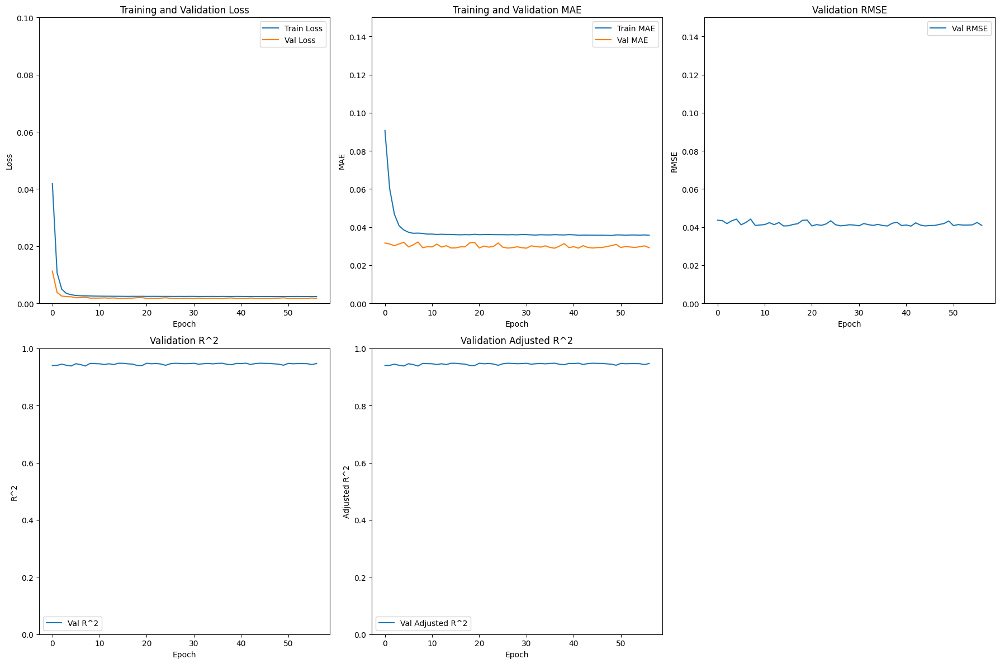

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history, metrics_callback):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 3, 1)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.ylim(0,.1)

    plt.subplot(2, 3, 2)
    plt.plot(history['mean_absolute_error'], label='Train MAE')
    plt.plot(history['val_mean_absolute_error'], label='Val MAE')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.title('Training and Validation MAE')
    plt.legend()
    plt.ylim(0,.15)

    plt.subplot(2, 3, 3)
    plt.plot(metrics_callback.val_rmse, label='Val RMSE')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.title('Validation RMSE')
    plt.legend()
    plt.ylim(0,.15)

    plt.subplot(2, 3, 4)
    plt.plot(metrics_callback.val_r2, label='Val R^2')
    plt.xlabel('Epoch')
    plt.ylabel('R^2')
    plt.title('Validation R^2')
    plt.legend()
    plt.ylim(0,1)

    plt.subplot(2, 3, 5)
    plt.plot(metrics_callback.val_adjusted_r2, label='Val Adjusted R^2')
    plt.xlabel('Epoch')
    plt.ylabel('Adjusted R^2')
    plt.title('Validation Adjusted R^2')
    plt.legend()
    plt.ylim(0,1)

    plt.tight_layout()
    plt.show()

# Plot training history
plot_training_history(history, metrics_callback)


## **Model Evaluation**

In [ ]:
# Check the shape of the predictions
print("Shape of y_pred:", y_pred.shape)

# Flatten predictions if needed
y_pred_flat = y_pred.flatten()

# Check the shape of the predictions
print("Shape of y_pred:", y_pred_flat.shape)

Shape of y_pred: (25511, 1)
Shape of y_pred: (25511,)


In [ ]:
# Check the shape of actual values
print("Shape of y_test:", y_test.shape)

# Ensure both arrays have the same length
assert y_test.shape[0] == y_pred_flat.shape[0], "Mismatch in number of predictions"


Shape of y_test: (25511, 1)


In [ ]:
# Flatten y_test if needed
y_test_flat = y_test.flatten()

# Check the shape of flattened y_test
print("Shape of y_test_flat:", y_test_flat.shape)

Shape of y_test_flat: (25511,)


In [ ]:
# Ensure both arrays have the same length
assert y_test_flat.shape[0] == y_pred_flat.shape[0], "Mismatch in number of predictions"

In [ ]:
# Compare predictions with actual values
comparison_df = pd.DataFrame({"Actual": y_test_flat, "Predicted": y_pred_flat})
print(comparison_df.head(10))

     Actual  Predicted
0  0.776699   0.796561
1  0.501618   0.466979
2  0.776699   0.797776
3  0.809061   0.804971
4  0.679612   0.685762
5  0.809061   0.808618
6  0.550162   0.493398
7  0.841424   0.810982
8  0.841424   0.834512
9  0.841424   0.819609


In [ ]:
from sklearn.metrics import r2_score

# Calculate R-squared
r2 = r2_score(y_test_flat, y_pred_flat)

print(f"R-squared (R²): {r2:.4f}")


R-squared (R²): 0.9481


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate metrics
mae = mean_absolute_error(y_test_flat, y_pred_flat)
mse = mean_squared_error(y_test_flat, y_pred_flat)
rmse = mse**0.5

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Mean Absolute Error (MAE): 0.0287
Mean Squared Error (MSE): 0.0016
Root Mean Squared Error (RMSE): 0.0402


## Actual Vs Predicted

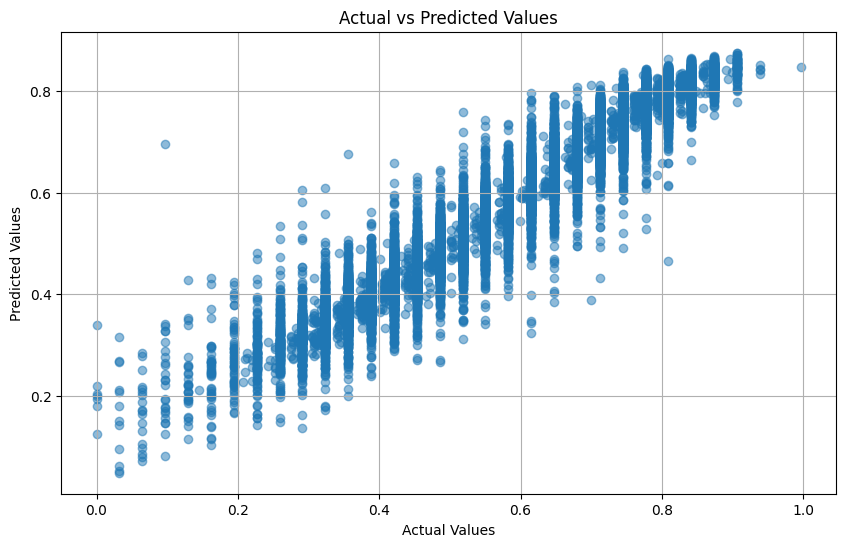

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat, y_pred_flat, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.grid(True)
plt.show()

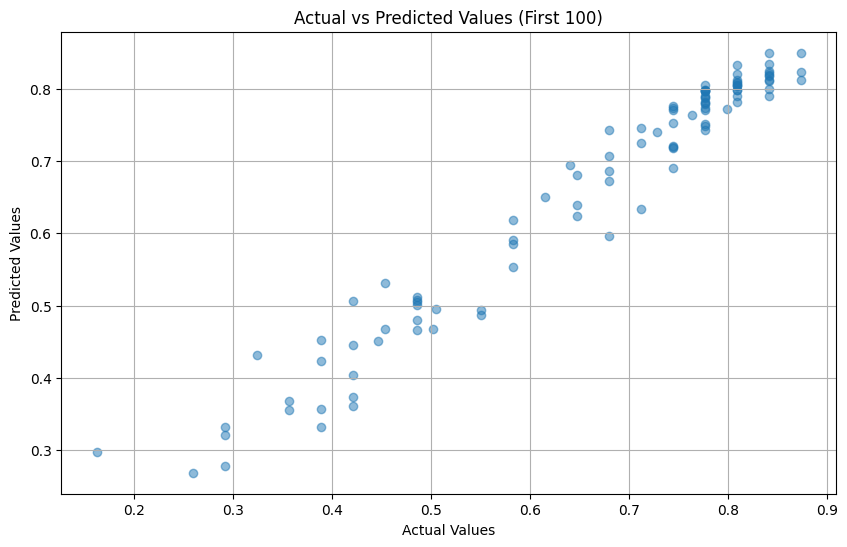

In [ ]:
# Select the first 100 values
n = 100
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat_subset, y_pred_flat_subset, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (First 100)")
plt.grid(True)
plt.show()


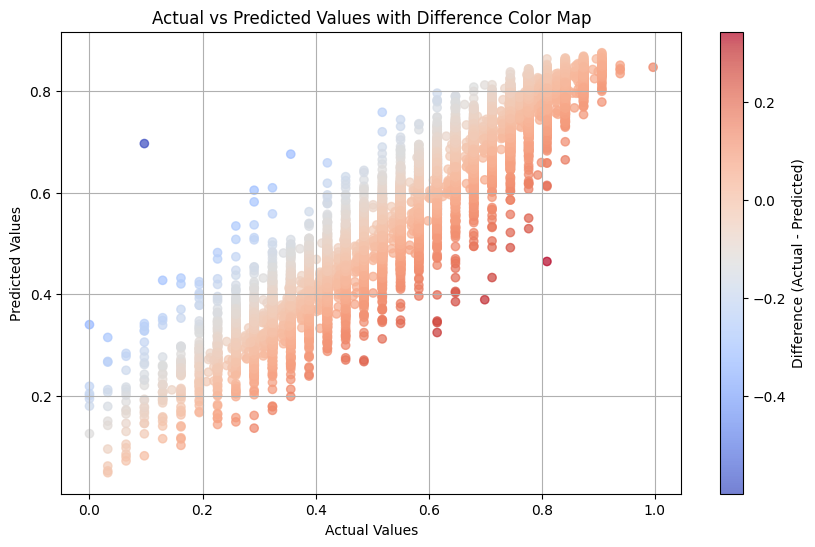

In [ ]:
# Calculate the difference between actual and predicted values
differences = y_test_flat - y_pred_flat

# Create a scatter plot with a color map
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test_flat, y_pred_flat, c=differences, cmap='coolwarm', alpha=0.7)
plt.colorbar(scatter, label='Difference (Actual - Predicted)')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values with Difference Color Map")
plt.grid(True)
plt.show()


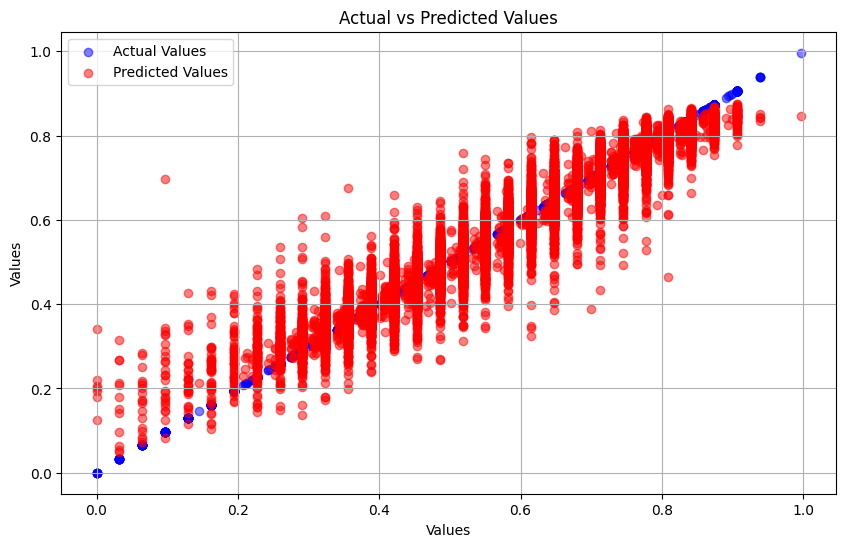

In [ ]:
plt.figure(figsize=(10, 6))

# Plot actual values
plt.scatter(y_test_flat, y_test_flat, color='blue', alpha=0.5, label='Actual Values')

# Plot predicted values
plt.scatter(y_test_flat, y_pred_flat, color='red', alpha=0.5, label='Predicted Values')

plt.xlabel("Values")
plt.ylabel("Values")
plt.title("Actual vs Predicted Values")
plt.legend()
plt.grid(True)
plt.show()


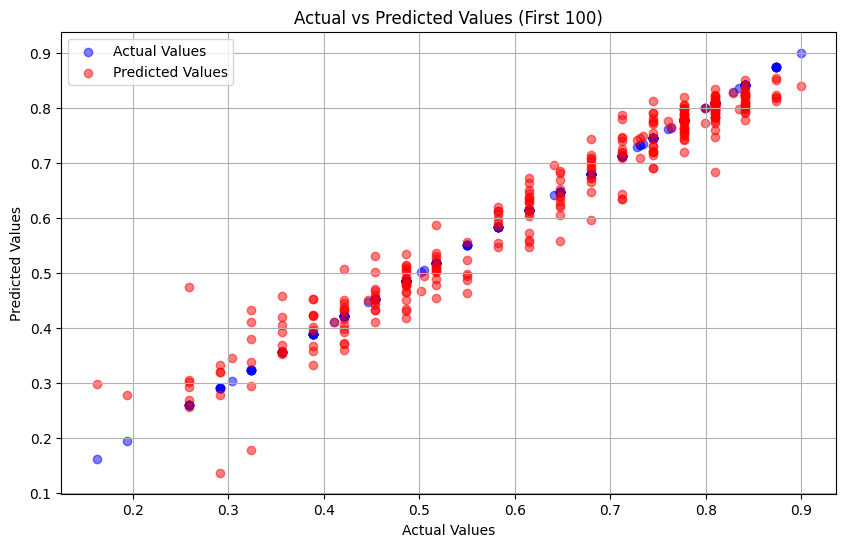

In [ ]:
# Select the first 100 values
n = 300
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

plt.figure(figsize=(10, 6))

# Plot actual values
plt.scatter(y_test_flat_subset, y_test_flat_subset, color='blue', alpha=0.5, label='Actual Values')

# Plot predicted values
plt.scatter(y_test_flat_subset, y_pred_flat_subset, color='red', alpha=0.5, label='Predicted Values')

plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (First 100)")
plt.legend()
plt.grid(True)
plt.show()


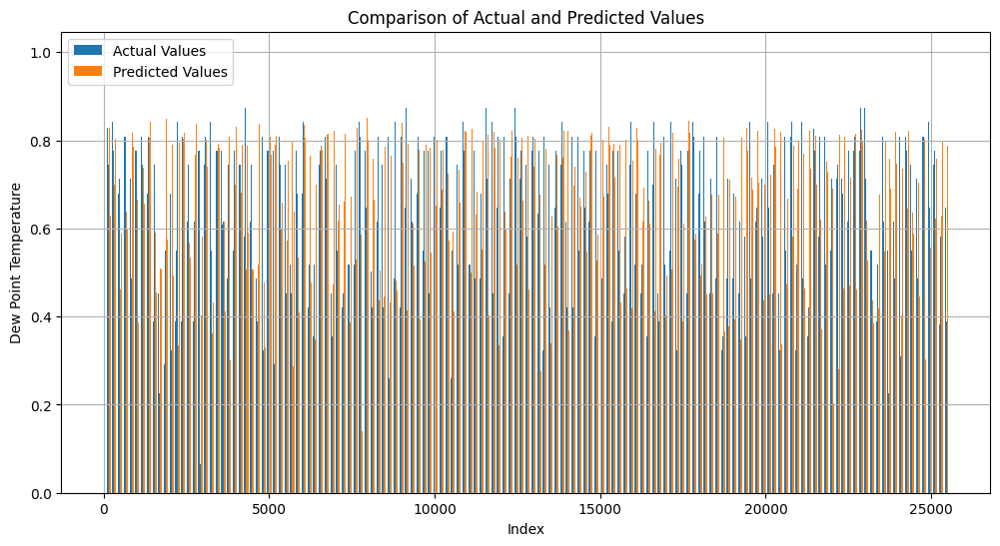

In [ ]:
x = np.arange(len(y_test_flat))
width = 0.35  # the width of the bars

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, y_test_flat, width, label='Actual Values')
plt.bar(x + width/2, y_pred_flat, width, label='Predicted Values')

plt.xlabel("Index")
plt.ylabel("Dew Point Temperature")
plt.title("Comparison of Actual and Predicted Values")
plt.legend()
plt.grid(True)
plt.show()


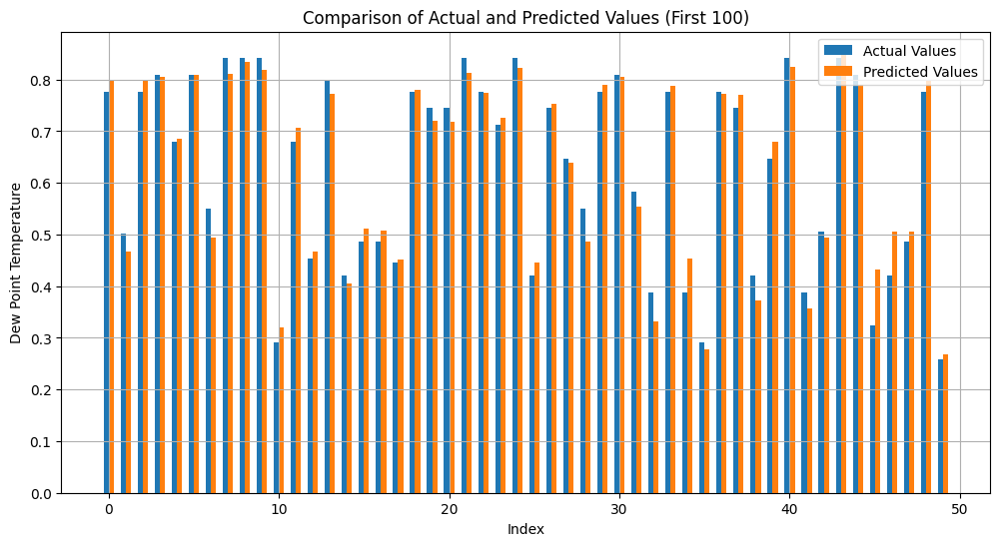

In [ ]:
# Number of samples to display
n = 50

# Subset of the first 100 actual and predicted values
x = np.arange(n)
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

width = 0.3  # the width of the bars

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, y_test_flat_subset, width, label='Actual Values')
plt.bar(x + width/2, y_pred_flat_subset, width, label='Predicted Values')

plt.xlabel("Index")
plt.ylabel("Dew Point Temperature")
plt.title("Comparison of Actual and Predicted Values (First 100)")
plt.legend()
plt.grid(True)
plt.show()


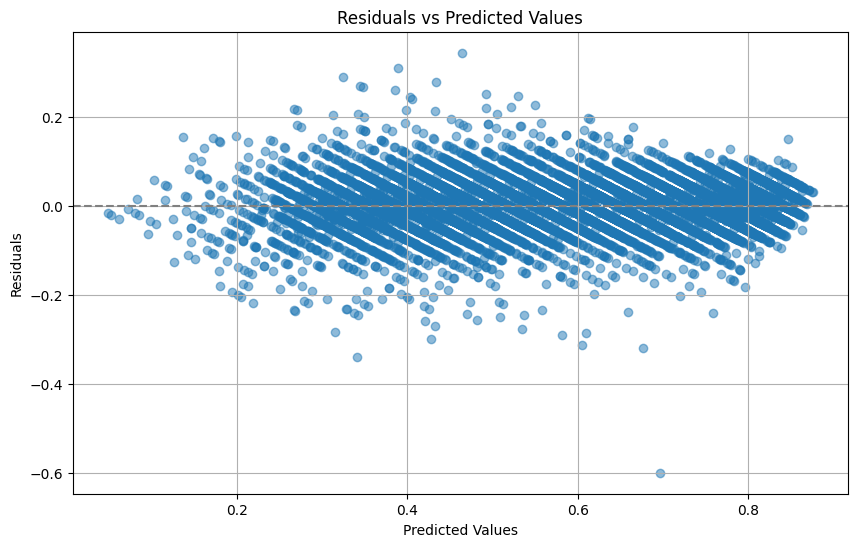

In [ ]:
# Assuming y_test_flat and y_pred_flat are your actual and predicted values respectively
residuals = y_test_flat - y_pred_flat

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_flat, residuals, alpha=0.5)
plt.axhline(y=0, color='gray', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted Values")
plt.grid(True)
plt.show()


In [ ]:
mean_residual = np.mean(residuals)
std_residual = np.std(residuals)

print(f"Mean of Residuals: {mean_residual:.4f}")
print(f"Standard Deviation of Residuals: {std_residual:.4f}")


Mean of Residuals: 0.0002
Standard Deviation of Residuals: 0.0402


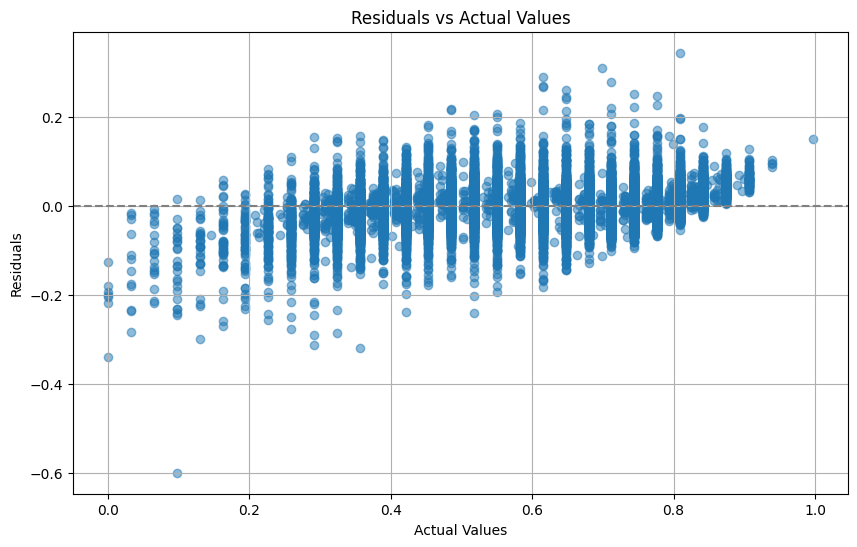

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat, residuals, alpha=0.5)
plt.axhline(y=0, color='gray', linestyle='--')
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Actual Values")
plt.grid(True)
plt.show()


In [ ]:
# Calculate and print summary statistics for residuals
mean_residual = np.mean(residuals)
std_residual = np.std(residuals)
skewness = stats.skew(residuals)
kurtosis = stats.kurtosis(residuals)

print(f"Mean of Residuals: {mean_residual:.4f}")
print(f"Standard Deviation of Residuals: {std_residual:.4f}")
print(f"Skewness of Residuals: {skewness:.4f}")
print(f"Kurtosis of Residuals: {kurtosis:.4f}")


Mean of Residuals: 0.0002
Standard Deviation of Residuals: 0.0402
Skewness of Residuals: -0.3663
Kurtosis of Residuals: 7.0485


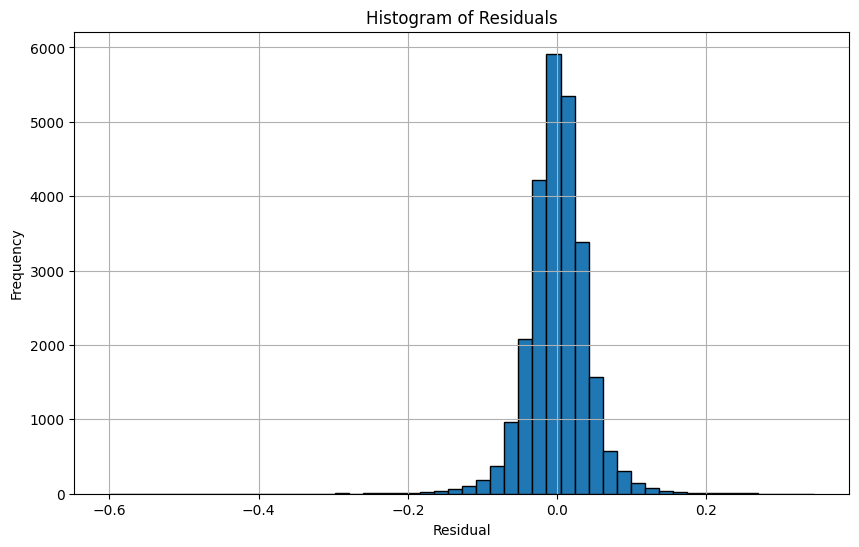

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=50, edgecolor='black')
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")
plt.grid(True)
plt.show()

In [ ]:
correlation = np.corrcoef(y_test_flat, y_pred_flat)[0, 1]
print(f"Correlation coefficient: {correlation:.4f}")

Correlation coefficient: 0.9738


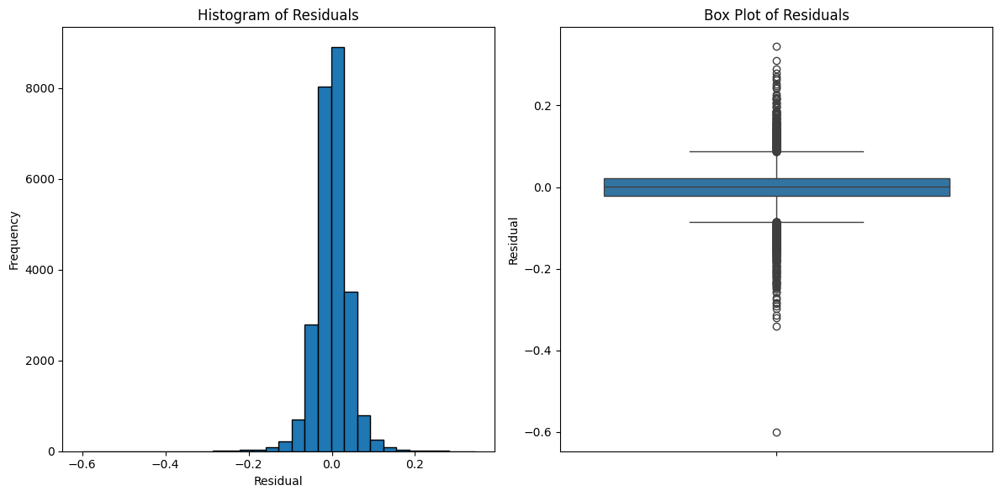

In [ ]:
import seaborn as sns
# Histogram of residuals
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(residuals, bins=30, edgecolor='k')
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.xticks()


# Box plot of residuals
plt.subplot(1, 2, 2)
sns.boxplot(y=residuals)
plt.title('Box Plot of Residuals')
plt.ylabel('Residual')
plt.xticks()

plt.tight_layout()
plt.show()


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Find indices where the error is less than 0.02
indices_less_than_0_02 = np.where(errors < 0.02)[0]

# Get the actual and predicted values for these indices
actual_values_less_than_0_02 = y_test_flat[indices_less_than_0_02]
predicted_values_less_than_0_02 = y_pred_flat[indices_less_than_0_02]

# Print out the number of such instances
print(f"Number of data points with error less than 0.02: {len(indices_less_than_0_02)}")

# Optionally, display some of these values
print("Some actual values with error less than 0.02:", actual_values_less_than_0_02[:10])
print("Some predicted values with error less than 0.02:", predicted_values_less_than_0_02[:10])


Number of data points with error less than 0.02: 12011
Some actual values with error less than 0.02: [0.77669903 0.80906149 0.67961165 0.80906149 0.84142395 0.45307443
 0.42071197 0.44660194 0.77669903 0.77669903]
Some predicted values with error less than 0.02: [0.7965605  0.8049711  0.6857622  0.80861765 0.83451164 0.46705276
 0.4043885  0.45115867 0.7791584  0.77418447]


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Define the bins
bins = [0, 0.05, 0.1, 0.15, 0.2]
bin_labels = ['0 to 0.05', '0.05 to 0.1', '0.1 to 0.15', '0.15 to 0.2']

# Calculate histogram counts for each bin
counts, _ = np.histogram(errors, bins=bins)

# Display the counts for each bin
for label, count in zip(bin_labels, counts):
    print(f"Count of data points with error in range {label}: {count}")


Count of data points with error in range 0 to 0.05: 21568
Count of data points with error in range 0.05 to 0.1: 3292
Count of data points with error in range 0.1 to 0.15: 478
Count of data points with error in range 0.15 to 0.2: 108


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Define the bins and bin labels
bins = [0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2]
bin_labels = ['0 to 0.02', '0.02 to 0.04', '0.04 to 0.06', '0.06 to 0.08',
              '0.08 to 0.1', '0.1 to 0.12', '0.12 to 0.14', '0.14 to 0.16',
              '0.16 to 0.18', '0.18 to 0.2']

# Calculate histogram counts for each bin
counts, _ = np.histogram(errors, bins=bins)

# Display the counts for each bin
for label, count in zip(bin_labels, counts):
    print(f"Count of data points with error in range {label}: {count}")


Count of data points with error in range 0 to 0.02: 12011
Count of data points with error in range 0.02 to 0.04: 7503
Count of data points with error in range 0.04 to 0.06: 3436
Count of data points with error in range 0.06 to 0.08: 1318
Count of data points with error in range 0.08 to 0.1: 592
Count of data points with error in range 0.1 to 0.12: 273
Count of data points with error in range 0.12 to 0.14: 159
Count of data points with error in range 0.14 to 0.16: 87
Count of data points with error in range 0.16 to 0.18: 41
Count of data points with error in range 0.18 to 0.2: 26


## **Saving the Actual vs Predicted Data**

In [ ]:
features.columns

Index(['Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
       'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer',
       'Season_Winter', 'Trend'],
      dtype='object')

### **Prediction Error Greater than 0.5**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 0.5
indices_high_error = np.where(errors > 0.5)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_0.5.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


  1/798 ━━━━━━━━━━━━━━━━━━━━ 4:07 311ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (15541, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_0.5.xlsx.


### **Prediction Error Greater than 1**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 1
indices_high_error = np.where(errors > 1)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_1.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 37/798 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (8192, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_1.xlsx.


### **Prediction Error Greater than 1.5**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 1.5
indices_high_error = np.where(errors > 1.5)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1//Prediction_Error_Greater_Than_1.5.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 34/798 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (4169, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1//Prediction_Error_Greater_Than_1.5.xlsx.


### **Prediction Error Greater than 2**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Train_Test_Data/Version_1/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))
# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 2
indices_high_error = np.where(errors > 2)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_2.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (2143, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Actual_Vs_Predicted/Version_1/Prediction_Error_Greater_Than_2.xlsx.


## **Making a prediction with new data**

## Trend Calculation

In [ ]:
import pandas as pd
import numpy as np

def get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew):
    # Filter the historical data based on the specified month, day, and time
    historical_data = df_dew[(df_dew['Month'] == future_month) & (df_dew['Day'] == future_day) & (df_dew['Time'] == future_time)]

    # Capture only 'Year' and 'Trend' columns
    historical_data = historical_data[['Year', 'Trend']]

    if historical_data.empty:
        return np.nan

    # Calculate the change in trend for future predictions
    historical_data['Trend_Change'] = historical_data['Trend'].diff()

    # Calculate average change, excluding NaN values
    average_change = np.round(historical_data['Trend_Change'].mean(), decimals=10)  # Control precision

    # # Debug: Print average change to check if it's consistent
    # print(f"Calculated average change: {average_change}")

    # Get the last trend from the historical data
    last_trend = historical_data[historical_data['Year'] == historical_data['Year'].max()]['Trend'].values[0]

    # Normalize the future year
    normalized_future_year = future_year - 1980

    # Calculate the difference in years
    current_year_normalized = historical_data['Year'].max()
    year_difference = normalized_future_year - current_year_normalized

    # Incrementally calculate the trend for the future year
    future_trend = last_trend + (year_difference * average_change)  # Increment by the average change multiplied by year difference

    return future_trend

# Example usage:
future_year = 2024
future_month = 7
future_day = 1
future_time = 18

trend_value = get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew)

print(f"Trend: {trend_value}")


Trend: 26.0636904762


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from tensorflow.keras.models import load_model
import joblib

def get_season(month, day):
    if (month == 11) or (month == 12) or (month == 1) or (month == 2):
        return 'Winter'
    elif (month >= 3 and month <= 6):
        return 'Summer'
    elif (month >= 7 and month <= 10):
        return 'Rainy'
    return 'Unknown'

def day_or_night(hour):
    return 'Day' if 6 <= hour < 18 else 'Night'

def get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew):
    # Filter the historical data based on the specified month, day, and time
    historical_data = df_dew[(df_dew['Month'] == future_month) & (df_dew['Day'] == future_day) & (df_dew['Time'] == future_time)]

    # Capture only 'Year' and 'Trend' columns
    historical_data = historical_data[['Year', 'Trend']]

    if historical_data.empty:
        return np.nan

    # Calculate the change in trend for future predictions
    historical_data['Trend_Change'] = historical_data['Trend'].diff()

    # Calculate average change, excluding NaN values
    average_change = np.round(historical_data['Trend_Change'].mean(), decimals=10)  # Control precision

    # # Debug: Print average change to check if it's consistent
    # print(f"Calculated average change: {average_change}")

    # Get the last trend from the historical data
    last_trend = historical_data[historical_data['Year'] == historical_data['Year'].max()]['Trend'].values[0]

    # Normalize the future year
    normalized_future_year = future_year - 1980

    # Calculate the difference in years
    current_year_normalized = historical_data['Year'].max()
    year_difference = normalized_future_year - current_year_normalized

    # Incrementally calculate the trend for the future year
    future_trend = last_trend + (year_difference * average_change)  # Increment by the average change multiplied by year difference

    return future_trend

def prepare_future_data(year, month, day, time, df):
    # Get season
    season = get_season(month, day)

    # One-hot encoding for seasons
    seasons = ['Winter', 'Summer', 'Rainy']
    season_one_hot = {f'Season_{s}': 0 for s in seasons}
    season_one_hot[f'Season_{season}'] = 1

    # Convert to DataFrame
    season_df = pd.DataFrame([season_one_hot])

    # Define the future date
    future_date = datetime(year=year, month=month, day=day)
    future_day_of_year = future_date.timetuple().tm_yday

    # Cyclical encoding
    future_month_sin = np.sin(2 * np.pi * month / 12)
    future_month_cos = np.cos(2 * np.pi * month / 12)
    future_time_sin = np.sin(2 * np.pi * time / 24)
    future_time_cos = np.cos(2 * np.pi * time / 24)

    # Determine day or night
    day_night = day_or_night(time)
    day_night_one_hot = {
        'DayOrNight_Day': 1 if day_night == 'Day' else 0,
        'DayOrNight_Night': 1 if day_night == 'Night' else 0
    }

    # Convert to DataFrame
    day_night_df = pd.DataFrame([day_night_one_hot])

    # Calculate trend and humidity
    trend_value = get_trend_moving_average(year, month, day, time, df_dew)
    # Create the future_data DataFrame with ordered features
    future_data = pd.DataFrame({
        'Year': [year - 1980],  # Normalize year relative to your dataset
        'Month_sin': [future_month_sin],
        'Month_cos': [future_month_cos],
        'DayOfYear': [future_day_of_year],
        'Time_sin': [future_time_sin],
        'Time_cos': [future_time_cos],
        'DayOrNight_Day': [day_night_one_hot['DayOrNight_Day']],
        'DayOrNight_Night': [day_night_one_hot['DayOrNight_Night']],
        'Season_Rainy': [season_one_hot['Season_Rainy']],
        'Season_Summer': [season_one_hot['Season_Summer']],
        'Season_Winter': [season_one_hot['Season_Winter']],
        'Trend': [trend_value],
    })
    return future_data

# Load your scalers and model
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

model_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras'
model = load_model(model_path)

# Example usage
year = 2030
month = 5
day = 1
time = 15  # Time in hours

# Prepare future data for prediction
df_year = pd.DataFrame({'Year': list(range(1980, 2024))})  # Historical year data

# Add your historical data to df_year for trend and humidity calculations
df_year = pd.concat([df_year, df_dew[['Year']]], ignore_index=True)

# Prepare future data for prediction
future_data = prepare_future_data(year, month, day, time, df_year)

# Scale the future data
future_data_scaled = feature_scaler.transform(future_data)

# Reshape the data to match the model input shape
future_data_scaled = future_data_scaled.reshape((1, 1, future_data_scaled.shape[1]))

# Make a prediction
prediction_scaled = model.predict(future_data_scaled)

# Inverse transform the prediction
prediction = target_scaler.inverse_transform(prediction_scaled)

# Display the prediction
print(f"Predicted Dew Point Temperature: {prediction[0][0]}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (1, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Predicted Dew Point Temperature: 22.310388565063477


## **Saving the Final Model For Nectron Visualization**

In [ ]:
# Load the trained model
model_load_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras'
best_model = tf.keras.models.load_model(model_load_path)


In [ ]:
# Save the model as an HDF5 (.h5) file
best_model.save('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.h5')


## **Model Visualizaions**

In [ ]:
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')
best_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 12)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 1, 192)         │          4,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 1, 192)         │         73,920 │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 192)         │              0 │ conv1d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 1, 192)         │              0 │ dropout[0][0],         │
│                           │                        │                │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 1, 192)         │         73,920 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 192)         │              0 │ conv1d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 1, 192)         │              0 │ dropout_1[0][0],       │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 1, 192)         │        148,224 │ add_1[0][0],           │
│ (MultiHeadAttention)      │                        │                │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 192)         │              0 │ multi_head_attention[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 1, 192)         │              0 │ add_1[0][0],           │
│                           │                        │                │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 192)            │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │         12,352 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 64)             │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 939,845 (3.59 MB)

 Trainable params: 313,281 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 626,564 (2.39 MB)

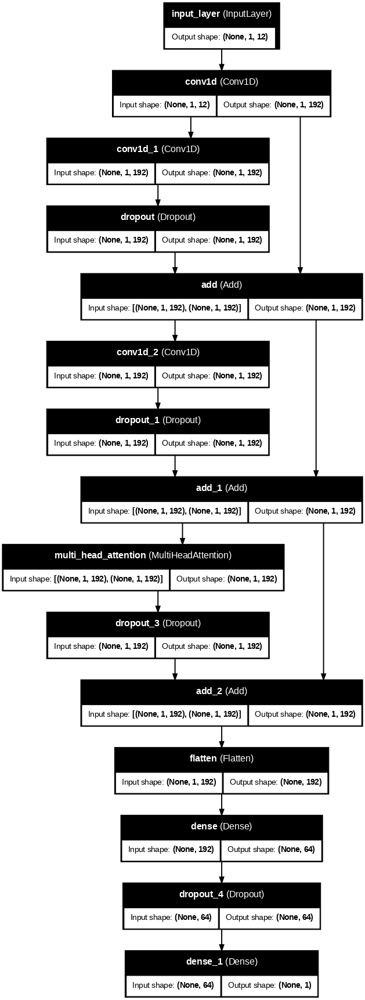

In [ ]:
# Load your best model
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# # Generate the model summary
# best_model.summary()

# Visualize and save the model structure
plot_model(best_model, to_file='model_structure.png', show_shapes=True, show_layer_names=True, dpi=70)


/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


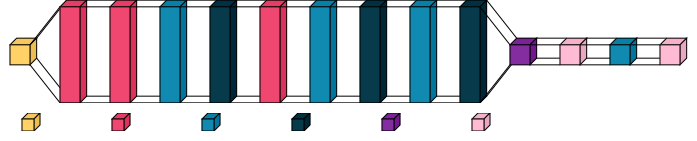

In [ ]:
# Load your best model
best_model = load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Model/Version_1/Rangpur_dew_point_model_best.keras')

# Adjust the layer types to ignore complex ones like MultiHeadAttention
# Specify which layers to ignore (e.g., attention layers)
visualkeras.layered_view(
    best_model,
    legend=True,
    scale_xy=0.5,
    spacing=30,
    type_ignore=[tf.keras.layers.MultiHeadAttention]  # Ignore the MultiHeadAttention layer
)


## **Loading Tensorboard Log**

In [ ]:
# Load TensorBoard extension in Colab (or Jupyter Notebook)
%load_ext tensorboard

# Start TensorBoard and point it to your log directory
%tensorboard --logdir '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/TensorBoard/Version_1/'


Output hidden; open in https://colab.research.google.com to view.

# **Model Interpretation Using Explainable AI(LIME and SHAP)**

## **1. LIME**

Feature scaler loaded from /content/drive/MyDrive/Dhaka Dew Point Temperature Prediction/Prediction Model/Deep Learning Model/TCN/Scaler/Version_10/Dhaka_dew_point_feature_scaler.pkl
Target scaler loaded from /content/drive/MyDrive/Dhaka Dew Point Temperature Prediction/Prediction Model/Deep Learning Model/TCN/Scaler/Version_10/Dhaka_dew_point_target_scaler.pkl


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


151/157 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


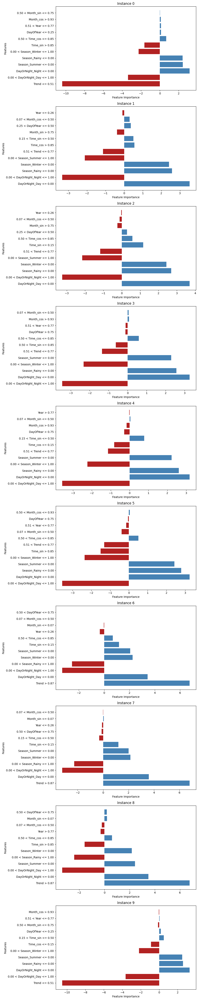

In [ ]:
# Define the directory containing the saved scalers
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/'

# Load the feature and target scalers
feature_scaler_path = os.path.join(directory, 'Rangpur_dew_point_feature_scaler.pkl')
target_scaler_path = os.path.join(directory, 'Rangpur_dew_point_target_scaler.pkl')

Rangpur_dew_point_feature_scaler = joblib.load(feature_scaler_path)
Rangpur_dew_point_target_scaler = joblib.load(target_scaler_path)

print(f"Feature scaler loaded from {feature_scaler_path}")
print(f"Target scaler loaded from {target_scaler_path}")

# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Rangpur_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Assume `features_scaled` is the scaled version of the feature data used for LIME
# Example: features_scaled = Rangpur_dew_point_feature_scaler.transform(features_df)

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features,  # Ensure features are correctly named
    mode='regression',  # For regression tasks
    training_labels=target_scaled.flatten()
)

# Number of instances to plot
num_instances = min(len(X_test), 10)  # Adjust as needed

# Create a figure with the exact number of subplots needed
fig, axes = plt.subplots(num_instances, 1, figsize=(10, 5 * num_instances), squeeze=False)

# Iterate through selected test instances
for i in range(num_instances):
    instance = X_test[i]  # Get instance
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features)
    )

    # Plot explanation
    feature_importances = explanation.as_list()
    feature_names, feature_weights = zip(*feature_importances)

    # Create bar plot for feature importances
    axes[i, 0].barh(feature_names, feature_weights, color=['steelblue' if w > 0 else 'firebrick' for w in feature_weights])
    axes[i, 0].set_title(f"Instance {i}")
    axes[i, 0].set_xlabel('Feature Importance')
    axes[i, 0].set_ylabel('Features')

# Adjust layout
plt.tight_layout()
plt.show()


157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


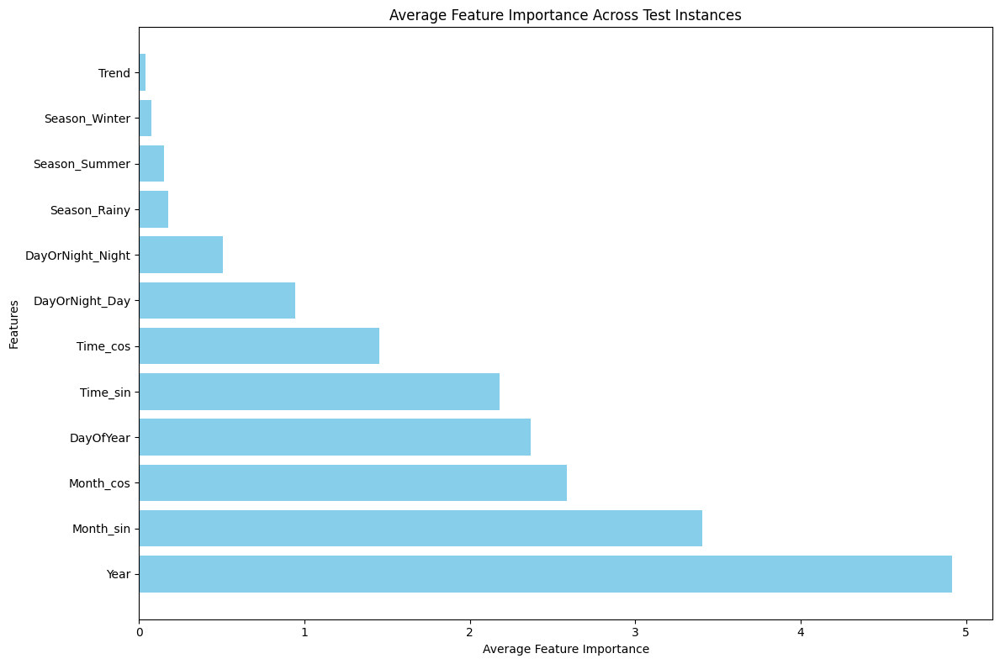

In [ ]:
# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Rangpur_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features.columns,
    mode='regression',  # For regression tasks
    training_labels=target_scaled.flatten()
)

# Number of instances to analyze
num_instances = min(len(X_test), 5)  # Adjust as needed

# Initialize arrays to store feature importances
feature_importances = np.zeros((num_instances, len(features.columns)))

# Generate explanations and aggregate feature importances
for i in range(num_instances):
    instance = X_test[i]  # Get instance
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features.columns)
    )

    # Store feature importances
    importances = np.array([x[1] for x in explanation.as_list()])
    feature_importances[i, :] = importances

# Calculate average feature importance across instances
avg_feature_importances = np.mean(np.abs(feature_importances), axis=0)

# Plot feature importances
plt.figure(figsize=(12, 8))
feature_names = features.columns
plt.barh(feature_names, avg_feature_importances, color='skyblue')
plt.xlabel('Average Feature Importance')
plt.ylabel('Features')
plt.title('Average Feature Importance Across Test Instances')
plt.tight_layout()
plt.show()


## Finding Global Features Importance

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━

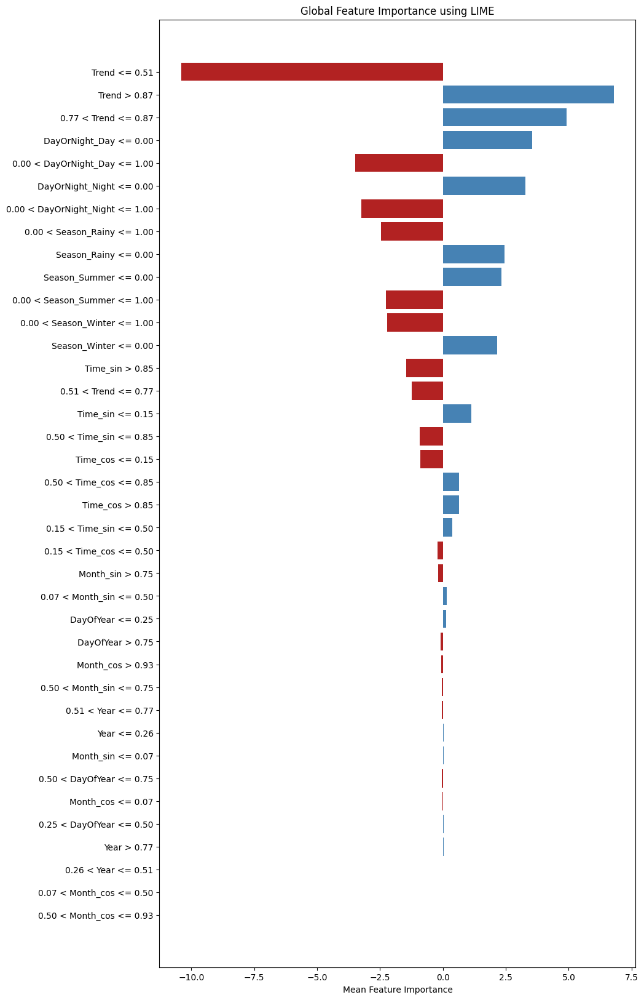

In [ ]:
# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Rangpur_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Rangpur/Scaler/Version_1/Rangpur_dew_point_target_scaler.pkl')

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features,
    mode='regression',  # For regression tasks
)

# Define the number of instances to sample
num_samples = 100  # You can increase or decrease based on your needs
sample_indices = random.sample(range(len(X_test)), num_samples)

# Dictionary to hold aggregated feature importance
global_feature_importance = {}

# Generate explanations for the selected sample
for i in sample_indices:
    instance = X_test[i]
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features)
    )

    # Extract feature importances from the explanation
    feature_importances = dict(explanation.as_list())

    # Aggregate feature importance scores
    for feature, importance in feature_importances.items():
        if feature not in global_feature_importance:
            global_feature_importance[feature] = []
        global_feature_importance[feature].append(importance)

# Calculate mean importance for each feature
mean_feature_importance = {feature: np.mean(importances) for feature, importances in global_feature_importance.items()}

# Sort features by mean importance
sorted_features = sorted(mean_feature_importance.items(), key=lambda x: abs(x[1]), reverse=True)

# Plot global feature importances
feature_names, feature_values = zip(*sorted_features)
plt.figure(figsize=(10, 20))
plt.barh(feature_names, feature_values, color=['steelblue' if value > 0 else 'firebrick' for value in feature_values])
plt.xlabel('Mean Feature Importance')
plt.title('Global Feature Importance using LIME')
plt.gca().invert_yaxis()
plt.show()


## **2. SHAP**

## Identify the Important Features globally

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059743
DayOrNight_Day      DayOrNight_Day                  0.057968
DayOrNight_Night  DayOrNight_Night                  0.055658
Season_Summer        Season_Summer                  0.041684
Season_Winter        Season_Winter                  0.035503


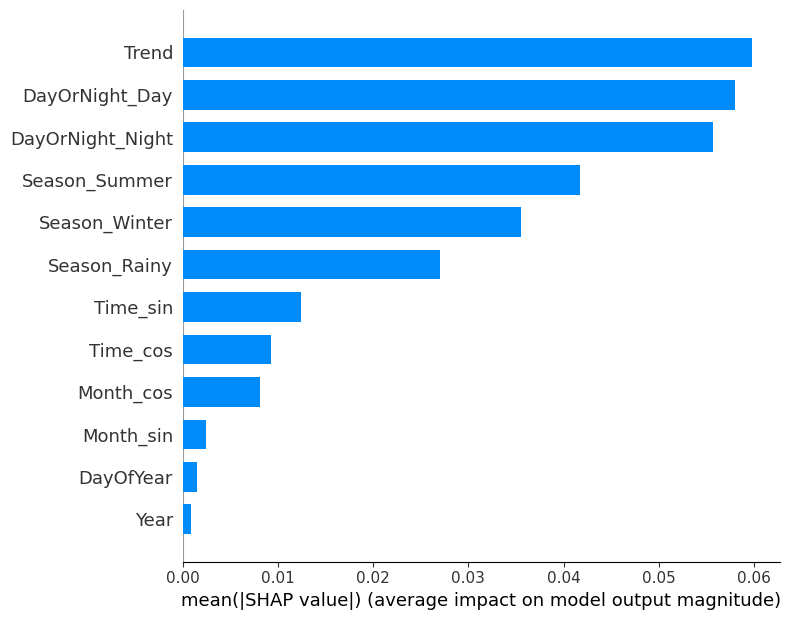

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a random sample from the test set
sample_size = 5  # Adjusted sample size
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_squeezed, X_test_sample_df, feature_names=feature_names, plot_type='bar')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059685
DayOrNight_Day      DayOrNight_Day                  0.057964
DayOrNight_Night  DayOrNight_Night                  0.055643
Season_Summer        Season_Summer                  0.041877
Season_Winter        Season_Winter                  0.035440


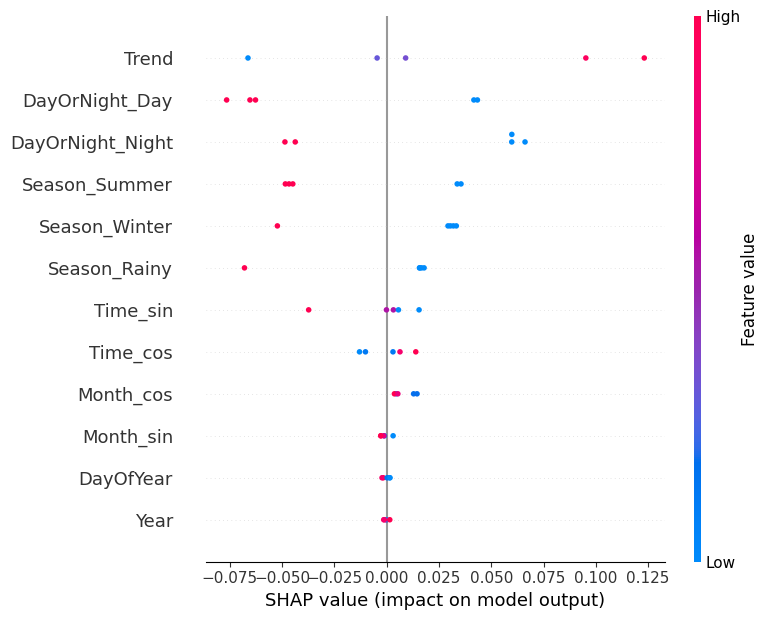

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_squeezed, X_test_sample_df, feature_names=feature_names)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059604
DayOrNight_Day      DayOrNight_Day                  0.058017
DayOrNight_Night  DayOrNight_Night                  0.055659
Season_Summer        Season_Summer                  0.041907
Season_Winter        Season_Winter                  0.035383


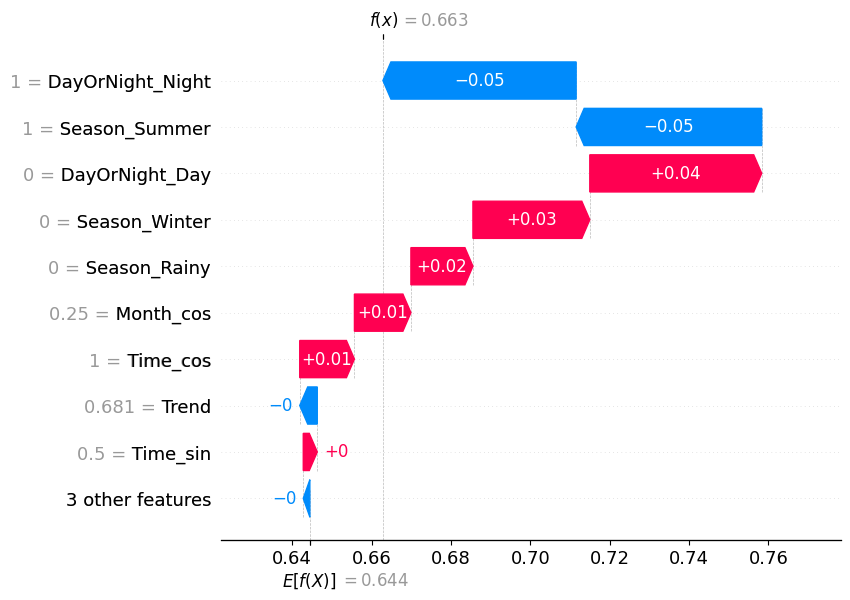

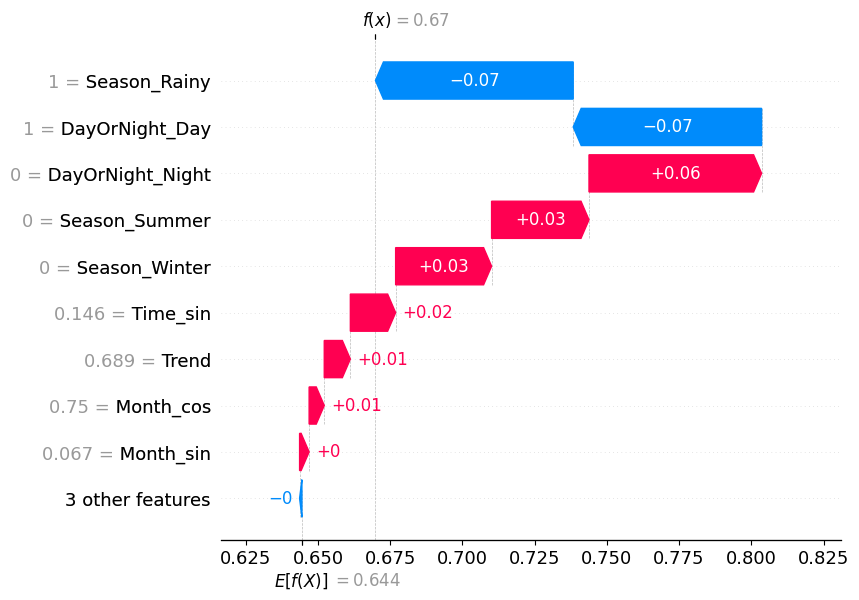

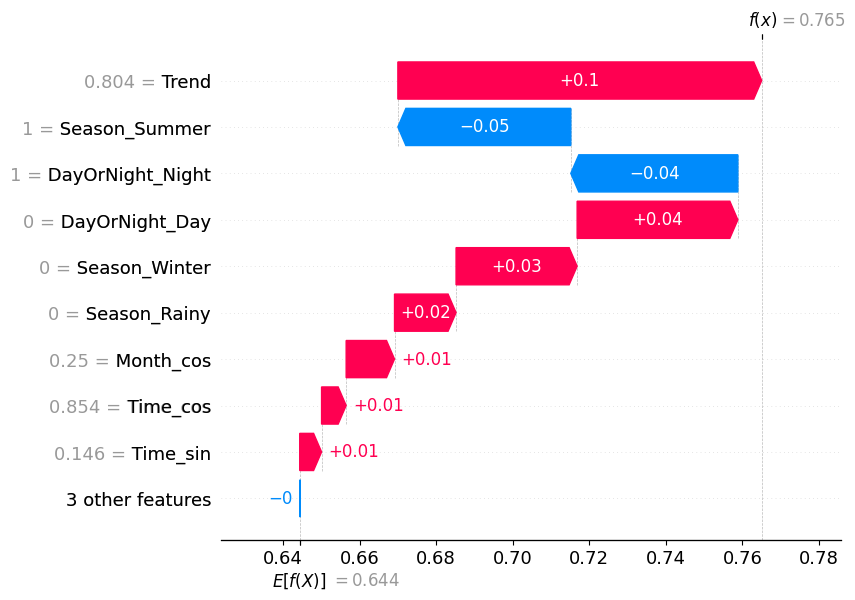

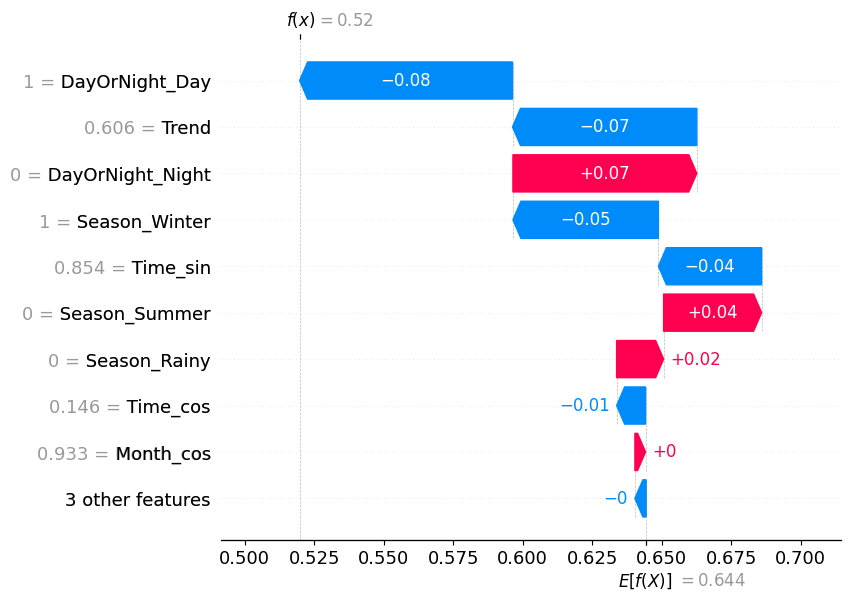

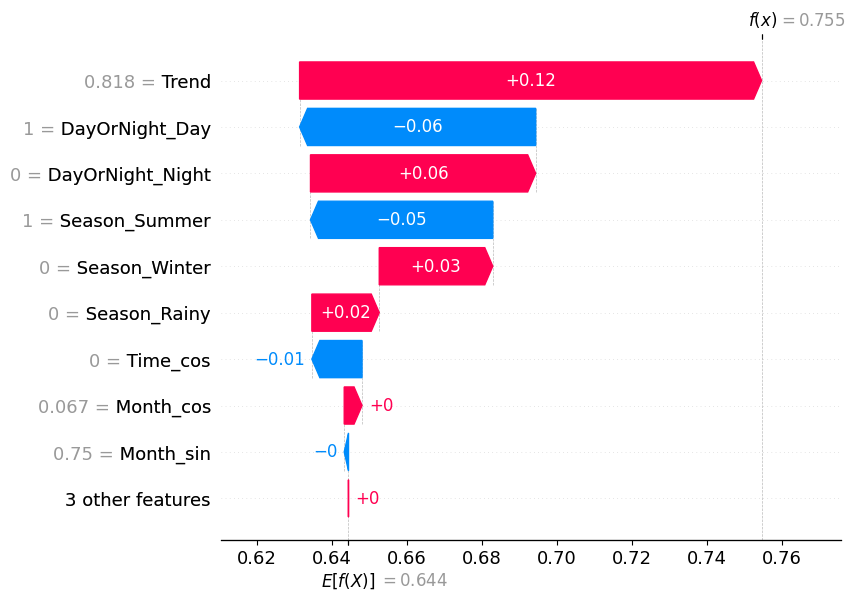

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))

# Plot SHAP waterfall plot for the first few samples
for i in range(min(num_samples, X_test_sample_df.shape[0])):
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_squeezed[i],
        base_values=explainer.expected_value,
        data=X_test_sample_df.iloc[i],
        feature_names=feature_names
    ))
    plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059583
DayOrNight_Day      DayOrNight_Day                  0.057875
DayOrNight_Night  DayOrNight_Night                  0.055587
Season_Summer        Season_Summer                  0.041684
Season_Winter        Season_Winter                  0.035531


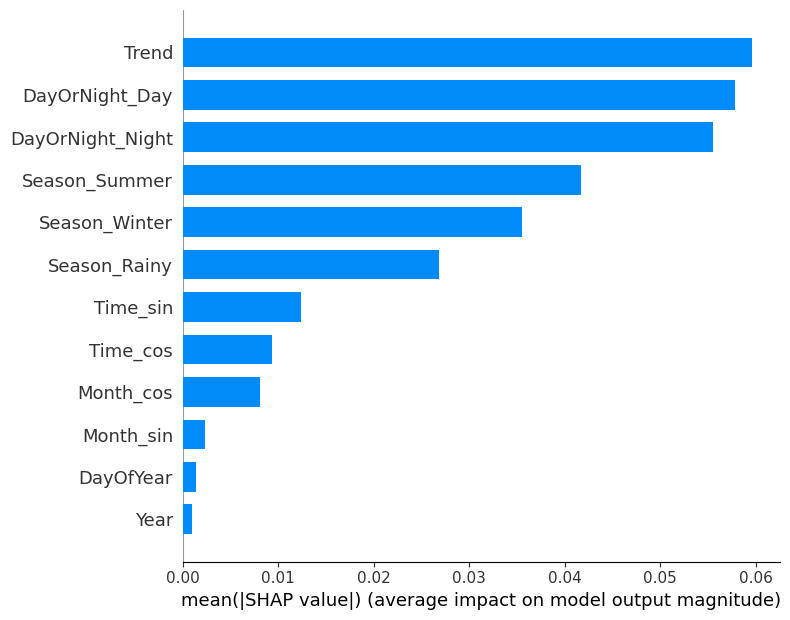

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_squeezed, X_test_sample_df, feature_names=feature_names, plot_type='bar')
plt.show()

# Initialize JS visualization for SHAP
shap.initjs()

# Plot SHAP force plots for specific instances
for i in range(min(sample_size, X_test_sample_df.shape[0])):
    try:
        # Create a force plot for each instance
        force_plot = shap.force_plot(
            explainer.expected_value,
            shap_values_squeezed[i],
            X_test_sample_df.iloc[i],
            feature_names=feature_names
        )

        # Display the plot inline (for Jupyter Notebook/Colab)
        display(force_plot)

        # Optionally, save the plot as an image
        plt.savefig(f'shap_force_plot_{i}.png')
        plt.close()

    except Exception as e:
        print(f"Error generating force plot for sample {i}: {e}")


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  0%|          | 0/39 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

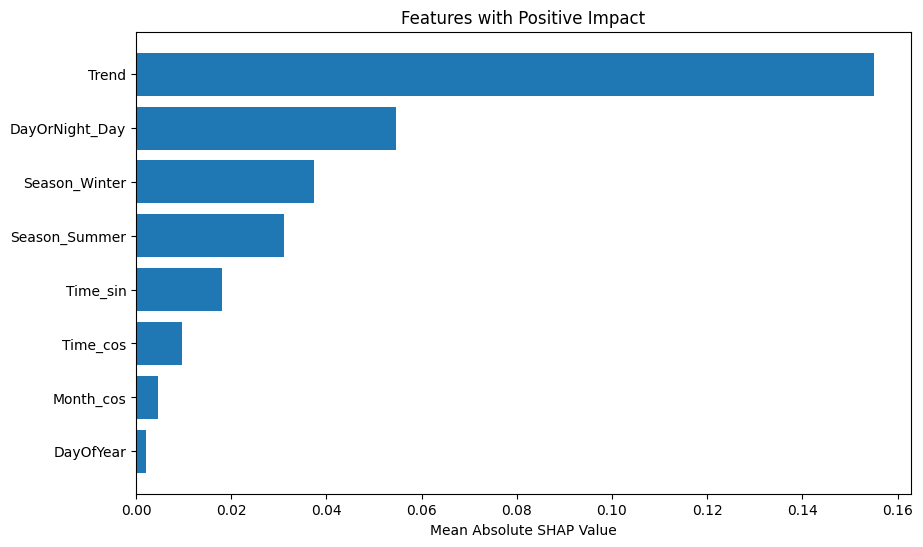

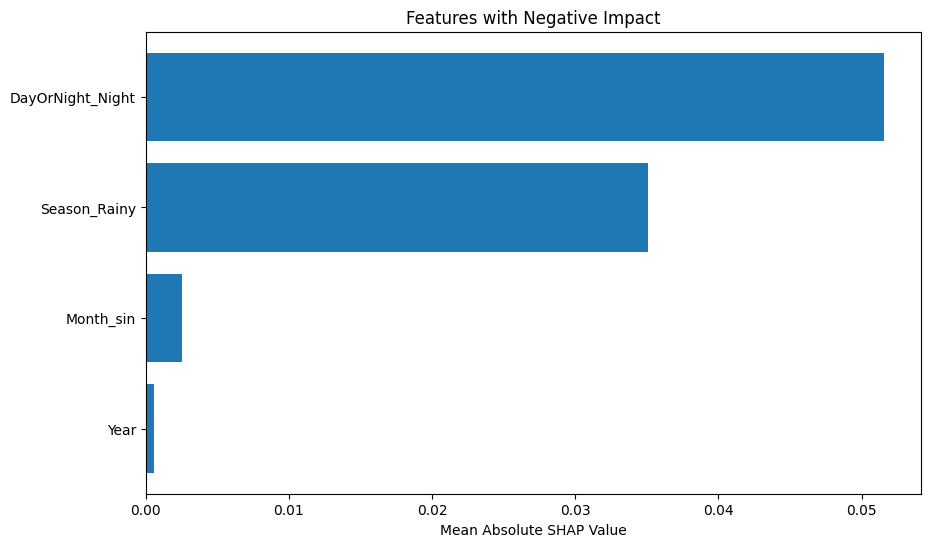

In [ ]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 39  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Calculate the average SHAP value for each feature
average_shap = shap_values_df.mean(axis=0)

# Create a DataFrame for feature impact
impact_df = pd.DataFrame({
    'Feature': feature_names,
    'Average SHAP Value': average_shap,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort by mean absolute SHAP value for overall importance
impact_df = impact_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Separate features into positive and negative impact
positive_impact_features = impact_df[impact_df['Average SHAP Value'] > 0]
negative_impact_features = impact_df[impact_df['Average SHAP Value'] < 0]

print("Positive Impact Features:")
print(positive_impact_features)

print("\nNegative Impact Features:")
print(negative_impact_features)

# Plot features with positive impact
plt.figure(figsize=(10, 6))
plt.barh(positive_impact_features['Feature'], positive_impact_features['Mean Absolute SHAP Value'])
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Features with Positive Impact')
plt.gca().invert_yaxis()
plt.show()

# Plot features with negative impact
plt.figure(figsize=(10, 6))
plt.barh(negative_impact_features['Feature'], negative_impact_features['Mean Absolute SHAP Value'])
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Features with Negative Impact')
plt.gca().invert_yaxis()
plt.show()


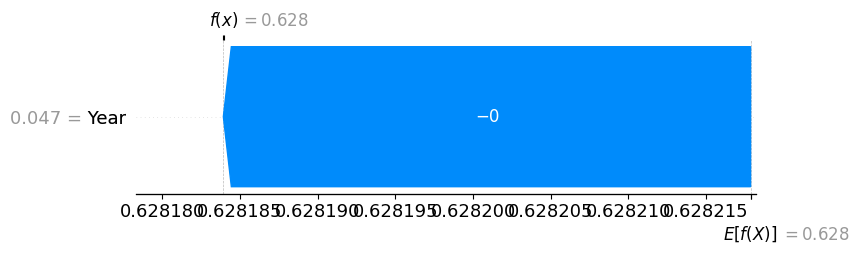

In [ ]:
# Ensure that shap_values is a list of arrays (one for each class or output)
# Select a single instance's SHAP values
shap_values_single_instance = shap_values[0][0]  # Adjust the index based on your model's output

# Plot the waterfall plot for the single instance
shap.waterfall_plot(shap.Explanation(
    values=shap_values_single_instance,
    base_values=explainer.expected_value,
    data=X_test_sample_df.iloc[0],
    feature_names=feature_names
))

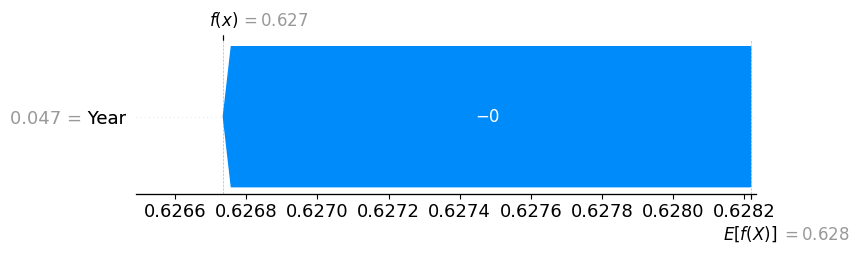

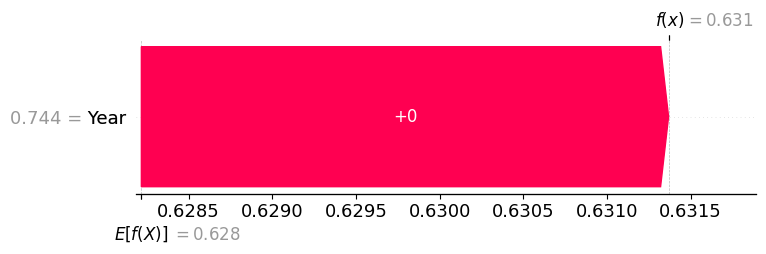

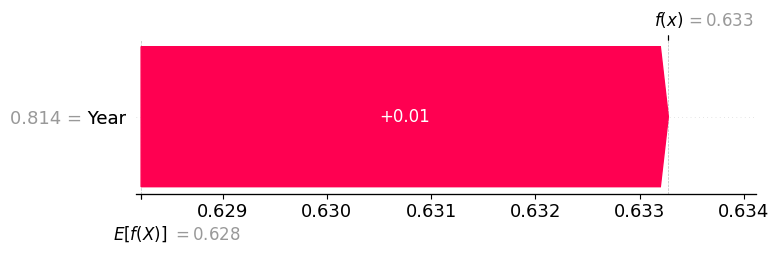

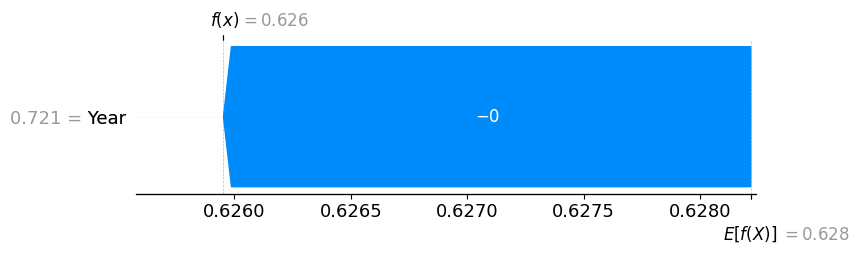

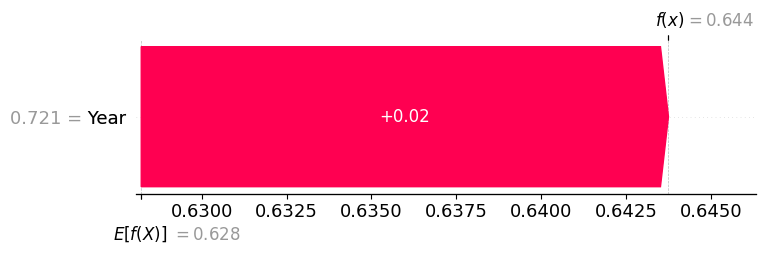

In [ ]:
# Example: Select the first few instances for detailed explanation
num_samples = 5  # Number of samples to plot
for i in range(num_samples):
    shap_values_single_instance = shap_values[1][i]
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_single_instance,
        base_values=explainer.expected_value,
        data=X_test_sample_df.iloc[i],
        feature_names=feature_names
    ))

## Global Importance Features

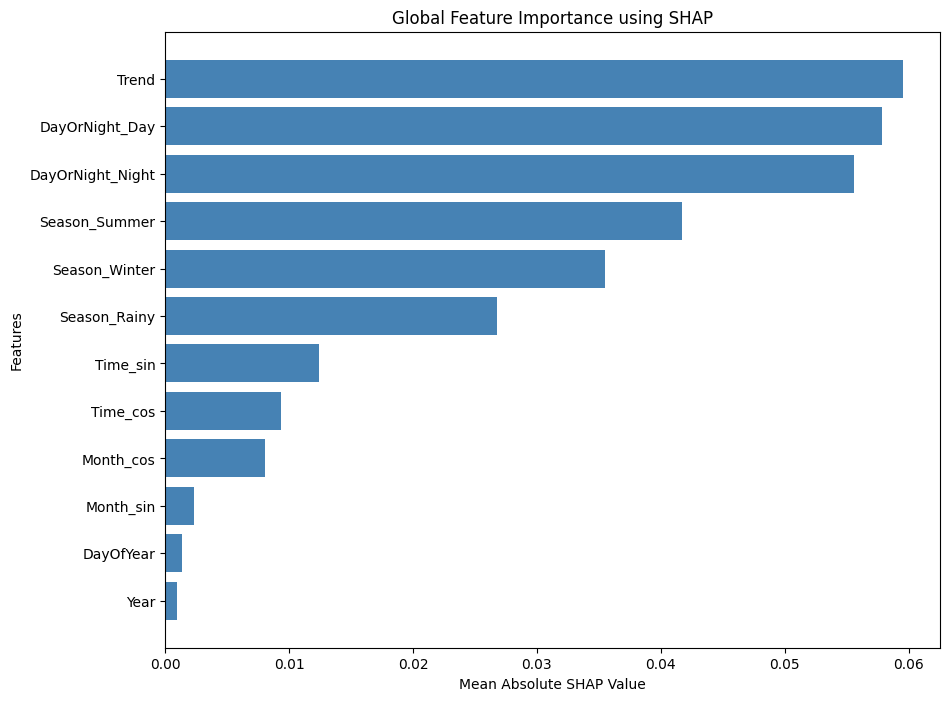

In [ ]:
# Plot global feature importance
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Mean Absolute SHAP Value'], color='steelblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.ylabel('Features')
plt.title('Global Feature Importance using SHAP')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()
